# <mark>Analysing Reputation of McDonalds company</mark>
### <mark>Using Sentiment analysis and Identifying factors</mark>

## Table of Contents

- [Loading Data & Cleaning](#loading-data--cleaning)
  - [Defining some Constants](#defining-some-constants)
  - [Loading the Dataset](#loading-the-dataset)
  - [Preprocessing](#preprocessing)
    - [Extracting and Converting Numerical Ratings](#extracting-and-converting-numerical-ratings)
    - [Checking for Duplicate Rows](#checking-for-duplicate-rows)
    - [Removing the Ratings 2 & 4](#removing-the-ratings-2--4)
    - [Checking for Null Values](#checking-for-null-values)
    - [Cleaning the Reviews](#cleaning-the-reviews)
    - [Handling Empty Values in Cleaned Reviews](#handling-empty-values-in-cleaned-reviews)
    - [Converting Ratings to Sentiment Categories](#converting-ratings-to-sentiment-categories)
    - [Converting Review Time to Date](#converting-review-time-to-date)

- [Exploratory Data Analysis (EDA)](#exploratory-data-analysis-eda)
  - [Distribution of Sentiments](#distribution-of-sentiments)
  - [Word Count of Cleaned Reviews](#word-count-of-cleaned-reviews)
  - [Review Length Distribution (Violin Plot)](#review-length-distribution-violin-plot)
  - [Word Clouds for Specific Sentiments](#word-clouds-for-specific-sentiments)
  - [Sentiment Trend Over Time](#sentiment-trend-over-time)
  - [Saving the Cleaned DataFrame to a CSV File](#saving-the-cleaned-dataframe-to-a-csv-file)

- [Preparing X & y for Further Usage](#preparing-x--y-for-further-usage)
  - [Preparing Data for Traditional Models](#preparing-data-for-traditional-models)
    - [Splitting Train and Test](#splitting-train-and-test)
    - [Vectorization](#vectorization)
    - [SMOTE](#smote)
  - [Preparing Data for Deep Learning Models](#preparing-data-for-deep-learning-models)
    - [Tokenization](#tokenization)
    - [Padding](#padding)
    - [Encoding Sentiment](#encoding-sentiment)
    - [Splitting Train & Test](#splitting-train--test)
    - [Compute Class Weights](#compute-class-weights)
    - [SMOTE Technique](#smote-technique)
    - [Split Train and Val](#split-train-and-val)
    - [Transfer Learning Method (Glove)](#transfer-learning-method-glove)

- [Functions](#functions)
  - [Accuracy and Loss](#accuracy-and-loss)
  - [PR-AUC and ROC-AUC](#pr-auc-and-roc-auc)
  - [Precision Recall and F1-Score Function](#precision-recall-and-f1-score-function)
  - [Confusion Matrix](#confusion-matrix)

- [Implementation of Models](#implementation-of-models)
  - [Baseline Model: Naive Bayes (Accuracy 81%)](#baseline-model-naive-bayes-accuracy-81)
  - [BERT Model (Accuracy 86%)](#bert-model-accuracy-86)
    - [Configuration](#configuration)
    - [Train, Val, Test Dataset Preparing](#train-val-test-dataset-preparing)
    - [Compute Class Weights](#compute-class-weights-1)
    - [Compute Metrics Function](#compute-metrics-function)
    - [Weighted Trainer Class](#weighted-trainer-class)
    - [Hyperparameter Tuning Function](#hyperparameter-tuning-function)
    - [Hyperparameter Optimization Process with Optuna](#hyperparameter-optimization-process-with-optuna)
    - [Train the Best Model](#train-the-best-model)

- [Evaluating the Model](#evaluating-the-model)
  - [Plot Learning Metrics](#plot-learning-metrics)
  - [Confusion Matrix](#confusion-matrix-1)
  - [Classification Report and Metrics](#classification-report-and-metrics)
  - [Model Output Sample Test](#model-output-sample-test)

- [Interpreting the Model](#interpreting-the-model)
  - [SHAP](#shap)
    - [Misclassifying Explainable by SHAP](#misclassifying-explainable-by-shap)
  - [LIME](#lime)
  - [Attention Mechanism](#attention-mechanism)
  - [Factor Analysis](#factor-analysis)

- [Extra Features!](#extra-features)
- [Extra Models!](#extra-models)
  - [Traditional Models](#traditional-models)
    - [Logistic Regression (Accuracy 80%)](#logistic-regression-accuracy-80)
    - [SVM (Accuracy 79%)](#svm--accuracy-79)
    - [Random Forest (Accuracy 84%)](#random-forest-accuracy-84)
  - [Deep Learning Models](#deep-learning-models)
    - [RNN (Accuracy 76%)](#rnn-accuracy-76)
    - [LSTM](#lstm)
      - [Simple LSTM (Accuracy 80%)](#simple-lstm-accuracy-80)
      - [Hyperparameter Tuning LSTM](#hyperparameter-tuning-lstm)
      - [LSTM - Best Model (Accuracy 82%)](#lstm---best-model-accuracy-82)
    - [BiLSTM (Accuracy 80%)](#bilstm-accuracy-80)
  - [Fine-Tuning Other Pretrained Models](#fine-tuning-other-pretrained-models)
    - [Roberta (Accuracy 84%)](#roberta-accuracy-84)


# Installation and Importing Libraries
___________________________

## Package Installation Check and Installer

This code snippet defines a function `install_package` that checks whether a specific package is installed in the Python environment. If the package is not installed, the function will automatically install it using `pip`.

In [1]:
import subprocess
import pkg_resources

# Checks if a package is installed, and installs it if it is not.
def install_package(package_name):
    try:
        # Check if the package is already installed
        pkg_resources.require(package_name)
        print(f"+ {package_name} is already installed.")
        
    except pkg_resources.DistributionNotFound:
        # If not installed, install it
        print(f"- {package_name} is not installed. Installing...")
        subprocess.check_call(["pip", "install", package_name])
        print(f"+ {package_name} has been successfully installed.")
        
    except pkg_resources.VersionConflict:
        # If the installed version conflicts with the required version
        installed = pkg_resources.working_set.by_key[package_name.lower()].version
        print(f"* A different version of {package_name} is installed: {installed}. Upgrade needed.")
        
    except Exception as e:
        print(f"-> An error occurred: {e}")

This code block aims to iterate over a list of packages, checking whether each one is installed and installing it if necessary.

In [2]:
# List of packages to check and possibly install
packages_to_install = [
    'pandas', 
    'tensorflow', 
    'keras',
    'torch',
    'nltk', 
    'gensim',
    'imbalanced-learn',
    'wordcloud',
    'keras-tuner',
    'transformers',
    'shap',
    'lime',
    'pyabsa',
    'accelerate',
    'statsmodels',
    'captum',
    'optuna'
]


!pip install 

for package in packages_to_install:
    install_package(package)

Defaulting to user installation because normal site-packages is not writeable
+ pandas is already installed.
+ tensorflow is already installed.
+ keras is already installed.


ERROR: You must give at least one requirement to install (see "pip help install")

[notice] A new release of pip is available: 23.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


- torch is not installed. Installing...
+ torch has been successfully installed.
- nltk is not installed. Installing...
+ nltk has been successfully installed.
- gensim is not installed. Installing...
+ gensim has been successfully installed.
- imbalanced-learn is not installed. Installing...
+ imbalanced-learn has been successfully installed.
+ wordcloud is already installed.
- keras-tuner is not installed. Installing...
+ keras-tuner has been successfully installed.
- transformers is not installed. Installing...
+ transformers has been successfully installed.
- shap is not installed. Installing...
+ shap has been successfully installed.
- lime is not installed. Installing...
+ lime has been successfully installed.
- pyabsa is not installed. Installing...
+ pyabsa has been successfully installed.
- accelerate is not installed. Installing...
+ accelerate has been successfully installed.
+ statsmodels is already installed.
- captum is not installed. Installing...
+ captum has been succe

## Importing Libraries
This cell imports various Python libraries and packages necessary for machine learning and deep learning tasks in NLP.

In [2]:
# Standard Library Imports
import os
import re
import pickle
import string
import tempfile
from datetime import datetime, timedelta

# Data Manipulation and Numerical Operations
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Natural Language Processing (NLP)
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize, RegexpTokenizer, sent_tokenize
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
import gensim
from gensim import corpora
import gensim.downloader as api

# Machine Learning and Feature Engineering
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE

# Machine Learning Models and Metrics
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, auc, classification_report, 
                             confusion_matrix, ConfusionMatrixDisplay, 
                             f1_score, precision_score, recall_score, 
                             precision_recall_curve, roc_auc_score, roc_curve,
                             precision_recall_fscore_support)
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from lightgbm import LGBMClassifier, plot_importance

# Deep Learning (TensorFlow/Keras)
import tensorflow as tf
from keras_tuner import HyperModel, RandomSearch
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.layers import (BatchNormalization, Bidirectional, Dense, 
                                     Dropout, Embedding, GlobalAveragePooling1D, 
                                     GRU, Input, LayerNormalization, LSTM, 
                                     MultiHeadAttention, SimpleRNN)
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import to_categorical

# Transformers (Hugging Face)
import transformers
from transformers import (BertConfig, BertForSequenceClassification, 
                          BertModel, BertTokenizer, EvalPrediction, 
                          TrainingArguments, Trainer, RobertaTokenizer, 
                          RobertaForSequenceClassification, RobertaConfig,
                          pipeline)
from transformers import logging as transformers_logging

# Interpretability Tools
import shap
from lime.lime_text import LimeTextExplainer
from captum.attr import IntegratedGradients

# PyTorch
import torch
import torch.optim as optim
from torch import nn

# Model Optimization
import optuna

# Miscellaneous
from pyabsa import ATEPCCheckpointManager, available_checkpoints
from pyabsa.functional import ABSADatasetList, ATEPCCheckpointManager
from statsmodels.miscmodels.ordinal_model import OrderedModel


To suppress warning messages generated during code execution, the following Python code snippet utilizes the `warnings` module to filter and ignore warnings:

In [3]:
import warnings
warnings.filterwarnings("ignore")

To ensure that NLTK (Natural Language Toolkit) has access to essential resources for text processing tasks, the following commands should be executed:

In [4]:
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\798677.ADIR\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\798677.ADIR\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\798677.ADIR\AppData\Roaming\nltk_data...
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\798677.ADIR\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

# Loading Data & Cleaning
___________________________

### Defining some Constants

In [5]:
sentiment_labels_map = {'negative': 0, 'neutral': 1, 'positive': 2} # Encode the labels
sentiment_titles = ['negative', 'neutral', 'positive']
sentiment_colors_map = {'neutral': 'skyblue', 'positive': 'green', 'negative': 'red'}  # Define colors for each sentiment

## Loading the Dataset

In [6]:
# Load the dataset
df = pd.read_csv("McDonald_s_Reviews.csv", encoding="latin-1")

In [7]:
df.head(5)

,reviewer_id,store_name,category,store_address,latitude,longitude,rating_count,review_time,review,rating
0,1,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",3 months ago,Why does it look like someone spit on my food?...,1 star
1,2,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",5 days ago,It'd McDonalds. It is what it is as far as the...,4 stars
2,3,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",5 days ago,Made a mobile order got to the speaker and che...,1 star
3,4,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",a month ago,My mc. Crispy chicken sandwich was ï¿½ï¿½ï¿½ï¿...,5 stars
4,5,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",2 months ago,"I repeat my order 3 times in the drive thru, a...",1 star


### Dataset info

In [8]:
df['rating'].value_counts().sort_index()

rating
1 star      9431
2 stars     3086
3 stars     4818
4 stars     5787
5 stars    10274
Name: count, dtype: int64

#### Rating statistics

In [9]:
# Calculate the word count for each review
df['pure_word_count'] = df['review'].apply(lambda x: len(x.split()))

In [10]:
# Descriptive statistics of review lengths
df[df['rating']== '1 star']['pure_word_count'].describe()

count    9431.000000
mean       37.043792
std        43.216728
min         1.000000
25%        10.000000
50%        24.000000
75%        48.000000
max       589.000000
Name: pure_word_count, dtype: float64

In [11]:
# Descriptive statistics of review lengths
df[df['rating']== '2 stars']['pure_word_count'].describe()

count    3086.000000
mean       28.496436
std        38.040205
min         1.000000
25%         6.000000
50%        17.000000
75%        36.000000
max       541.000000
Name: pure_word_count, dtype: float64

In [12]:
# Descriptive statistics of review lengths
df[df['rating']== '3 stars']['pure_word_count'].describe()

count    4818.000000
mean       17.565795
std        26.598607
min         1.000000
25%         2.000000
50%         9.000000
75%        22.000000
max       449.000000
Name: pure_word_count, dtype: float64

In [13]:
# Descriptive statistics of review lengths
df[df['rating']== '4 stars']['pure_word_count'].describe()

count    5787.000000
mean       14.996717
std        24.604402
min         1.000000
25%         1.000000
50%         7.000000
75%        18.000000
max       474.000000
Name: pure_word_count, dtype: float64

In [14]:
# Descriptive statistics of review lengths
df[df['rating']== '5 stars']['pure_word_count'].describe()

count    10274.000000
mean        12.576309
std         19.993854
min          1.000000
25%          1.000000
50%          5.000000
75%         15.000000
max        320.000000
Name: pure_word_count, dtype: float64

## Preprocessing

In [15]:
unuseful_columns = ['reviewer_id','store_name', 'category', 'store_address', 'latitude ','longitude',  'rating_count','pure_word_count']
df.drop(unuseful_columns, axis=1, inplace=True)

### Extracting and Converting Numerical Ratings

In [16]:
# Extract the numerical rating from the 'rating' column
df['rating'] = df['rating'].str.split().str[0]

# Convert the 'rating' column to numeric type
df['rating'] = pd.to_numeric(df['rating'])

### Checking for duplicate rows

In [17]:
# Finding Duplicate rows (However kept for the effect they have on the model and word cloud and etc.
df[(df['review'].duplicated()) & (df['rating'].duplicated())].rating.value_counts().sort_index()

rating
1    2228
2     848
3    1678
4    2237
5    4120
Name: count, dtype: int64

##### Droping positive duplicates

##### Dropping negative duplicates

### Removing the ratings 2 & 4

In [18]:
# Removing reviews with rating 2 and 4 (Because they don't have specific sentiment)
df = df[~df['rating'].isin([2, 4])] 

### Checking for Null Values

In [19]:
# Checking for any null values
df.isnull().sum()

review_time    0
review         0
rating         0
dtype: int64

### Cleaning the reviews

In [20]:
def clean_text(texts,model):
    """
    Clean and preprocess a list of text strings based on the specified model type.

    Parameters:
    -----------
    texts : list of str
        A list of text strings to be cleaned and preprocessed.
    
    model : str
        Specifies the model type for which the text is being cleaned. 
        Options are:
        - 'traditional': Applies traditional text preprocessing steps such as lowercasing, 
                         URL removal, non-alphabetic character removal, tokenization, 
                         lemmatization, and stopword removal.
        - 'deep_learning': Applies preprocessing steps suited for deep learning models, 
                           including lowercasing, removing special characters (except alphanumeric, 
                           spaces, and basic punctuation), and removing extra spaces.

    Returns:
    --------
    cleaned_texts : list of str
        A list of cleaned and preprocessed text strings.

    Example Usage:
    --------------
    cleaned_texts = clean_text(['This is a sample text! Visit http://example.com for more info.'], 'traditional')
    cleaned_texts = clean_text(['Another sample text? Sure!'], 'deep_learning')
    """
    stop_words = set(stopwords.words('english'))
    
    lemmatizer = WordNetLemmatizer()

    cleaned_texts = []
    for text in texts:
        if model == 'traditional':
            # Lowercase text
            text = text.lower()
            # Remove URLs
            text = re.sub(r'https?://\S+|www\.\S+', '', text)
            # Remove non-alphabetic characters
            text = re.sub('[^a-z]+', ' ', text)
            # Tokenize text
            tokens = word_tokenize(text)
            # Lemmatize and remove stopwords
            tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
            cleaned_text = ' '.join(tokens)
            
        elif model == 'deep_learning':
            text = re.sub(r'[^a-zA-Z0-9\s!?]', '', text)  # Keep alphanumeric characters and basic punctuation
            text = re.sub(r'\s+', ' ', text).strip()  # Remove extra spaces
            text = text.lower()  # Convert to lowercase
            cleaned_text = text
        cleaned_texts.append(cleaned_text)
    
    return cleaned_texts

In [21]:
# Applying the 'clean_text' function for Traditional models
df['cleaned_review_for_traditional_models'] = clean_text(df['review'].tolist(), model='traditional')

In [22]:
# Applying the 'clean_text' function for Deep learning models
df['cleaned_review_for_deep_models'] = clean_text(df['review'].tolist(), model='deep_learning')

### Handling Empty Values in Cleaned Reviews

In [23]:
# Checking for any empty values after cleaning
df[df.cleaned_review_for_traditional_models == '']

,review_time,review,rating,cleaned_review_for_traditional_models,cleaned_review_for_deep_models
229,a year ago,They canï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿...,1,,they can
363,3 years ago,They donï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿...,1,,they don
604,3 years ago,ýýýý ýýý,5,,
1310,4 years ago,It is what it is.,3,,it is what it is
1461,5 years ago,I donï¿½ï¿½ï¿½ï,1,,i don
...,...,...,...,...,...
32976,3 years ago,Itï¿½ï¿½ï¿½ï¿½ï¿½ï¿½,1,,it
32982,3 years ago,Itï¿½ï¿½ï¿½ï¿½ï¿½ï¿,1,,it
33011,4 years ago,ýýýý ýýý,5,,
33019,6 months ago,Itï¿½ï¿½ï¿½ï¿½ï¿½ï¿½,5,,it


In [24]:
# Removing the empty values of reviews after cleaning
df = df[df['cleaned_review_for_traditional_models'].notna() & (df['cleaned_review_for_traditional_models'] != '')]

### Converting ratings to sentiment categories

In [25]:
# Function to convert star ratings to sentiments
def rating_to_sentiment(rating):
    if rating > 3:
    #if '5 star' in rating or '4 star' in rating:
        return 'positive'
    elif rating ==3:
        return 'neutral'
    elif rating <3:
        return 'negative'
    else:
        return 'unknown'

# Apply the function to create a sentiment column
df['sentiment'] = df['rating'].apply(rating_to_sentiment)

df['label'] = df['sentiment'].map(sentiment_labels_map)

In [26]:
df.sentiment.value_counts()

sentiment
positive    10224
negative     9385
neutral      4793
Name: count, dtype: int64

### Converting review time to date

In [27]:
# Define a base date for the conversion (e.g., '01/01/2024')
base_date = datetime.strptime('01/01/2024', '%d/%m/%Y')

# Function to convert relative date strings (e.g., "3 days ago", "a month ago") to exact dates based on a base date
def convert_to_date(date_str, base_date):
    if isinstance(date_str, str):  # Only process if it's a string
        # Match patterns like "3 months ago", "a month ago", "5 days ago", "6 hours ago", "30 minutes ago"
        match = re.match(r'(a|\d+)\s*(minute|hour|day|week|month|year)s?\s*ago', date_str.lower())
        
        if match:
            value, unit = match.group(1), match.group(2)
            if value == 'a':
                value = 1  # Convert 'a' to 1 for uniform processing
            else:
                value = int(value)
                
            if unit == 'minute':
                return base_date - timedelta(minutes=value)
            elif unit == 'hour':
                return base_date - timedelta(hours=value)
            elif unit == 'day':
                return base_date - timedelta(days=value)
            elif unit == 'week':
                return base_date - timedelta(weeks=value)
            elif unit == 'month':
                return base_date - pd.DateOffset(months=value)
            elif unit == 'year':
                return base_date - pd.DateOffset(years=value)
        
        # Handle specific cases like "today" and "yesterday"
        if 'today' in date_str.lower():
            return base_date
        if 'yesterday' in date_str.lower():
            return base_date - timedelta(days=1)
    
    return date_str  # Return as is if it's not a string or doesn't match the patterns

# Apply the conversion function to the 'review_time' column and store the results in the 'date' column
df['date'] = df['review_time'].apply(lambda x: convert_to_date(x, base_date))

# Exploratory data analysis (EDA)
___________________________

## Distribution of sentiments

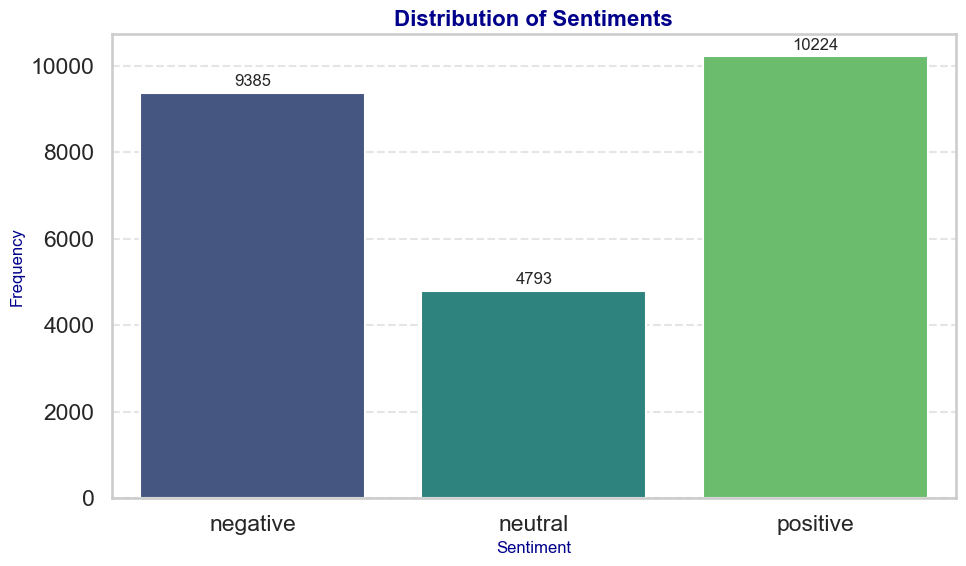

In [28]:
# Count the occurrences of each sentiment and sort by index (e.g., 'negative', 'neutral', 'positive')
rating_counts = df['sentiment'].value_counts().sort_index()

# Set the style and context
sns.set(style='whitegrid', context='talk')

# Create the plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='viridis')

# Add value labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 8), 
                textcoords = 'offset points',
               fontsize='12')

# Add titles and labels with a more sophisticated style
plt.title('Distribution of Sentiments', fontsize=16, weight='bold', color='darkblue')
plt.xlabel('Sentiment', fontsize=12,  color='darkblue')
plt.ylabel('Frequency', fontsize=12,  color='darkblue')

# Customize the grid
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Tight layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

## Word Count of Cleaned Reviews

In [29]:
# Calculate the word count for each review
df['word_count'] = df['cleaned_review_for_traditional_models'].apply(lambda x: len(x.split()))

# Descriptive statistics of review lengths
review_length_stats = df['word_count'].describe()
print(review_length_stats)

count    24402.000000
mean        11.765716
std         15.836453
min          1.000000
25%          2.000000
50%          6.000000
75%         15.000000
max        254.000000
Name: word_count, dtype: float64


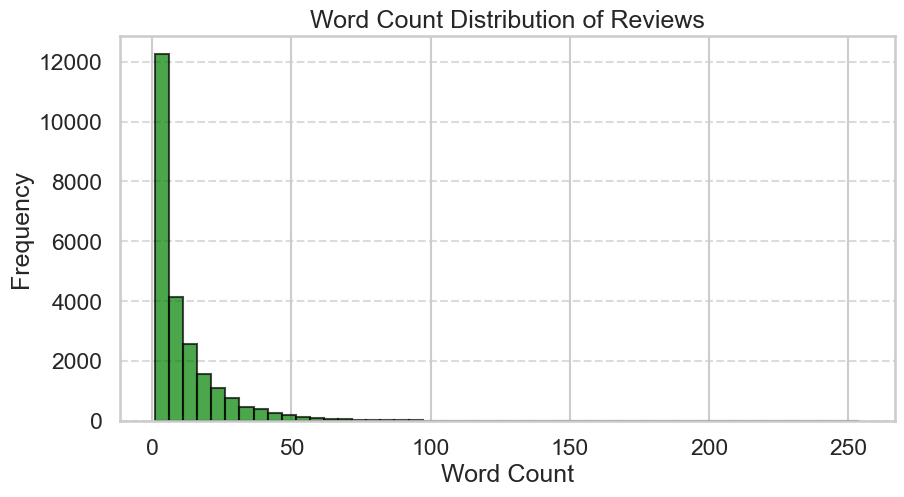

In [30]:
# Plot the distribution of word counts
plt.figure(figsize=(10, 5))
plt.hist(df['word_count'], bins=50, color='green', edgecolor='black' , alpha=0.7)
plt.title('Word Count Distribution of Reviews')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## Review Length Distribution (Violin Plot)

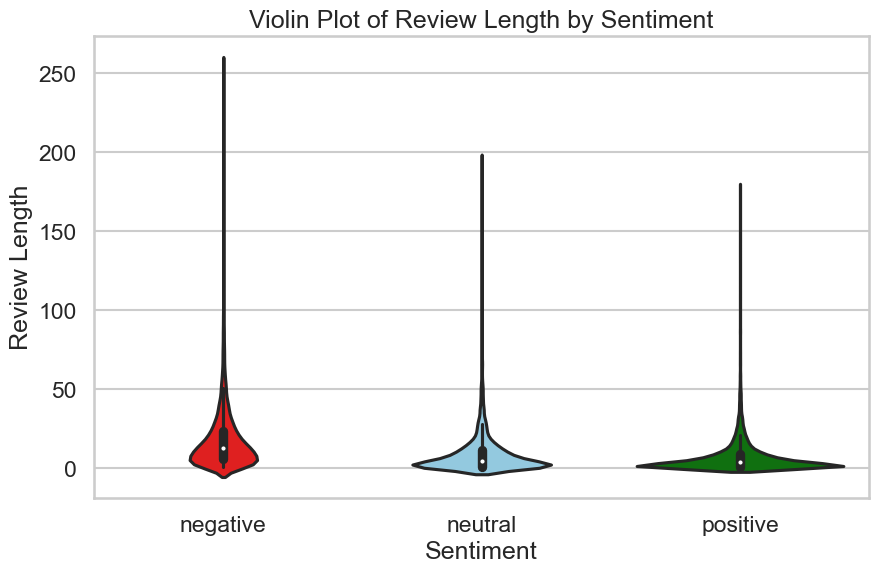

In [31]:
# Create a violin plot to visualize the distribution of review lengths across different sentiments
plt.figure(figsize=(10, 6))
sns.violinplot(x='sentiment', y='word_count', data=df, order=sentiment_titles, palette=sentiment_colors_map)
plt.title('Violin Plot of Review Length by Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Review Length')
plt.show()

## Word Clouds for Specific Sentiments

In [32]:
def plot_word_clouds(df, text_column, label_column, specific_sentiment):
    """
    Generates and displays a word cloud for a specified sentiment.

    Parameters:
    -----------
    df : pd.DataFrame
        The DataFrame containing review texts and their corresponding sentiment labels.
    text_column : str
        The name of the column in the DataFrame that contains the text data.
    label_column : str
        The name of the column in the DataFrame that contains numeric sentiment labels.
    specific_sentiment : str
        The sentiment descriptor (e.g., 'negative', 'neutral', 'positive') for which to generate the word cloud.
    
    Description:
    ------------
    This function filters the review texts in the DataFrame based on the specified sentiment label
    and generates a word cloud to visually represent the most frequent words associated with that sentiment.
    The word cloud is styled with a color scheme that corresponds to the sentiment (e.g., 'Reds' for negative,
    'Greens' for positive).

    Example Usage:
    --------------
    plot_word_clouds(df, text_column='review_text', label_column='sentiment', specific_sentiment='positive')
    
    """
    # Map sentiment descriptions to numeric labels (0: negative, 1: neutral, 2: positive)
    sentiment_map = {'negative': 0, 'neutral':1 , 'positive': 2}
    
    # Color schemes for different sentiments
    color_map = {
        'negative': 'Reds',
        'neutral': 'Blues',
        'positive': 'Greens'
    }
    
    if specific_sentiment in df[label_column].unique():
        # Filter texts by sentiment
        texts = df[df[label_column] == specific_sentiment][text_column]
        all_text = ' '.join(texts)

        # Generate word cloud with custom color scheme
        wordcloud = WordCloud(width=800, height=400, background_color='black',
                              colormap=color_map[specific_sentiment], max_font_size=150, max_words=150).generate(all_text)

        # Display the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for {specific_sentiment.capitalize()} Sentiment', size=20)
        plt.axis('off')
        plt.show()
    else:
        print(f"No data found for the sentiment: {specific_sentiment}")


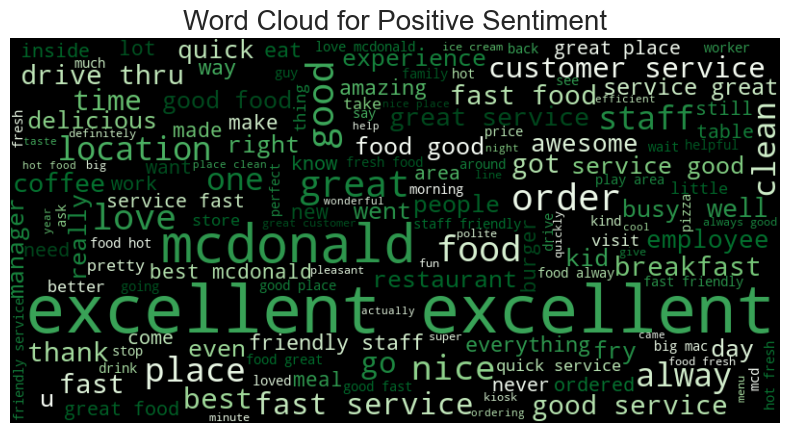

In [35]:
# Display Worc clouds for Positive Sentiment
plot_word_clouds(df, 'cleaned_review_for_traditional_models', 'sentiment', 'positive') 

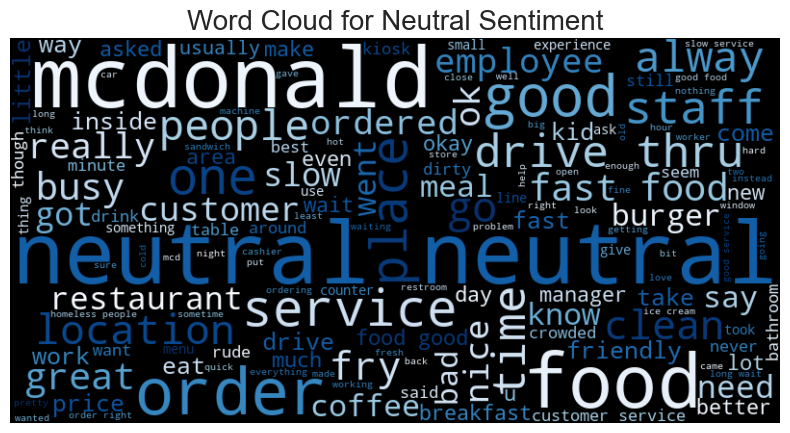

In [33]:
# Display Worc clouds for Neutral Sentiment
plot_word_clouds(df, 'cleaned_review_for_traditional_models', 'sentiment', 'neutral')

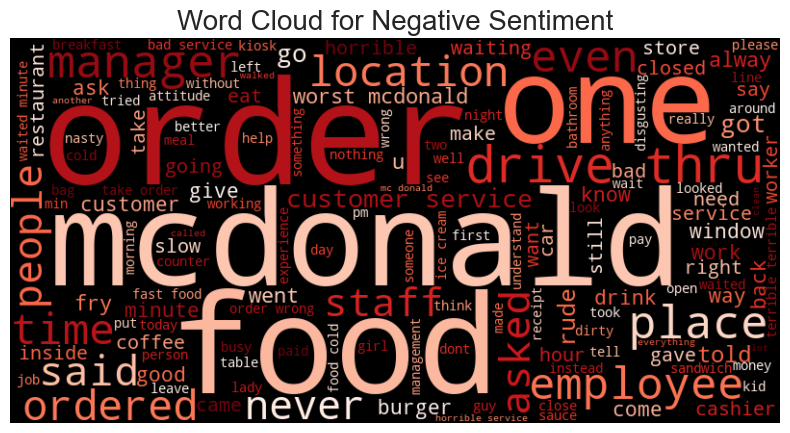

In [34]:
# Display Worc clouds for Negative Sentiment
plot_word_clouds(df, 'cleaned_review_for_traditional_models', 'sentiment', 'negative')

## Sentiment Trend over time

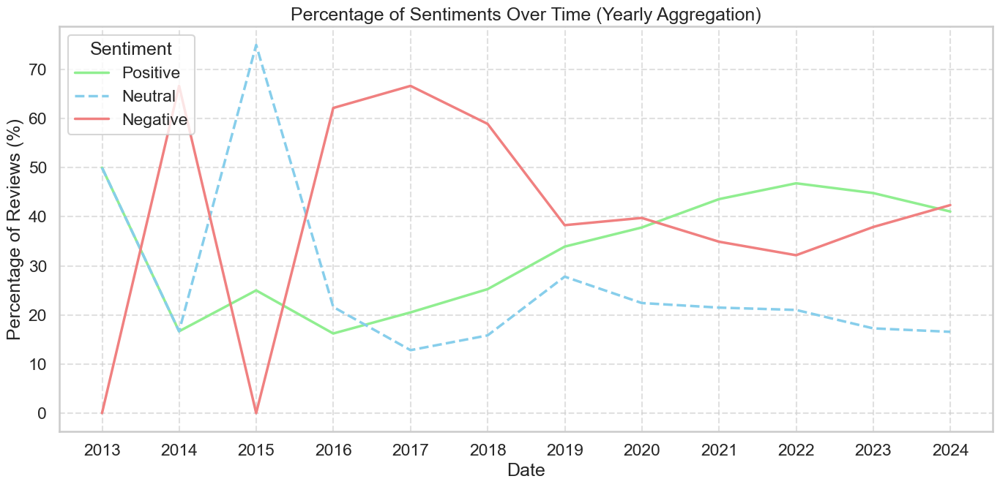

In [35]:
# Group by the 'date' and 'sentiment' columns, then count occurrences, using a yearly frequency
# This will give us the number of reviews per sentiment for each year.
sentiment_counts = df.groupby([pd.Grouper(key='date', freq='Y'), 'sentiment']).size().unstack(fill_value=0)

# Calculate the percentage of each sentiment over the total number of reviews per year
# This helps in understanding the relative distribution of sentiments over time.
sentiment_percentage = sentiment_counts.div(sentiment_counts.sum(axis=1), axis=0) * 100

# Define custom colors and line styles
custom_palette = {
    'positive': 'lightgreen',
    'neutral': 'skyblue',
    'negative': 'lightcoral'
}

# Plot the trends as a line plot with custom colors and styles
plt.figure(figsize=(14, 7))

# Plot the trend for positive sentiment
sns.lineplot(data=sentiment_percentage['positive'], color=custom_palette['positive'], linewidth=2.5, label='Positive')
# Plot the trend for neutral sentiment with a dashed line style
sns.lineplot(data=sentiment_percentage['neutral'], color=custom_palette['neutral'], linewidth=2.5, linestyle='--', label='Neutral')
# Plot the trend for negative sentiment
sns.lineplot(data=sentiment_percentage['negative'], color=custom_palette['negative'], linewidth=2.5, label='Negative')

# Formatting the x-axis dates for better readability
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y'))
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.YearLocator())  # Show every year

plt.title('Percentage of Sentiments Over Time (Yearly Aggregation)')
plt.xlabel('Date')
plt.ylabel('Percentage of Reviews (%)')
plt.legend(title='Sentiment', loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

## Extracting the Cleaned DataFrame to a CSV File

In [36]:
# Drop the specified columns from the DataFrame as they are no longer needed for further analysis
df.drop(columns=['review', 'rating', 'word_count', 'review_time', 'date'], inplace=True)

In [39]:
# Save the cleaned DataFrame to a CSV file
df.to_csv('cleaned_mcdonald_df.csv', index=False)

# Preparing X & y for further usage
___________________________

In [40]:
df = pd.read_csv('cleaned_mcdonald_df.csv', encoding="latin-1")

In [41]:
X_cleaned = df['cleaned_review_for_traditional_models']

In [42]:
X = df['cleaned_review_for_deep_models']
y = df['label']

## Preparing data for traditional models

### splitting train and test

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X_cleaned, y, test_size=0.2, random_state=42, stratify=y)

### vectorization

In [44]:
# Initialize the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=3000, min_df=5, max_df=0.7, stop_words='english')

X_vec = tfidf_vectorizer.fit_transform(X_cleaned)

In [45]:
X_train_vec, X_test_vec, y_train_vec, y_test_vec = train_test_split(X_vec, y, test_size=0.2, random_state=42, stratify=y)

### SMOTE

In [46]:
# Apply SMOTE to oversample the minority classes in the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_vec, y_train_vec)

## Preparing data for deep learning models

### Tokenization

In [47]:
tokenizer = Tokenizer(num_words=5000, oov_token="<OOV>")  # This keeps the 5,000 most common words
tokenizer.fit_on_texts(X)

X_seq = tokenizer.texts_to_sequences(X)

### Padding

In [48]:
maxlen = 100  # Maximum length of all sequences

X_pad = pad_sequences(X_seq, padding='pre', maxlen=maxlen)

### encoding sentiment

In [49]:
# Encode labels if they are categorical (not necessary if using one-hot encoding)
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)

### splitting train & test

In [50]:
X_train_pad, X_test_pad, y_train_pad, y_test_pad = train_test_split(X_pad, y, test_size=0.2, random_state=42, stratify=y)

### Compute class weights

In [51]:
# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train_pad),
    y=y_train_pad)

class_weight_dict = dict(enumerate(class_weights))
class_weight_dict

{0: 0.8666755460841769, 1: 1.6971830985915493, 2: 0.7955740310551412}

### SMOTE technique

In [52]:
# Apply SMOTE to oversample the minority classes in the training set
smote = SMOTE(random_state=42)
X_train_pad_smote, y_train_pad_smote = smote.fit_resample(X_train_pad, y_train_pad)

### split train and val

In [53]:
X_train_pad_smote_splited, X_val_pad_smote_splited, y_train_pad_smote_splited, y_val_pad_smote_splited = train_test_split(X_train_pad_smote, y_train_pad_smote, test_size=0.25, random_state=42, stratify=y_train_pad_smote)

In [54]:
# Check class distribution in validation set
unique, counts = np.unique(y_val_pad_smote_splited, return_counts=True)
validation_class_distribution = dict(zip(unique, counts))
print("Validation Set Class Distribution:", validation_class_distribution)

Validation Set Class Distribution: {0: 2045, 1: 2045, 2: 2045}


### Transfer learning method (Glove)

In [55]:
def load_glove_embeddings(path):
    embeddings_index = {}
    with open(path, encoding="utf8") as f:
        for line in f:
            values = line.split()
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = coefs
    return embeddings_index

glove_path = 'glove.6B.100d.txt'
embeddings_index = load_glove_embeddings(glove_path)

In [56]:
def create_embedding_matrix(word_index, embeddings_index, embedding_dim):
    vocabulary_size = len(word_index) + 1  # Adding 1 to fit Keras embedding (indexing starts at 1)
    embedding_matrix = np.zeros((vocabulary_size, embedding_dim))
    for word, i in word_index.items():
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector  # words not found in embedding index will be all-zeros.
    return embedding_matrix

In [57]:
word_index = tokenizer.word_index
embedding_dim = 100  # Dimensionality of GloVe embeddings used
num_words=5000
embedding_matrix = create_embedding_matrix(word_index, embeddings_index, embedding_dim)

# Functions
___________________________

## Accuracy and Loss

In [58]:
def plot_metrics(history):
    """
    Plots training and validation accuracy and loss for a binary classification model.

    Args:
    history: A Keras History object returned by the fit method of a model.
    """
    # Extracting the metrics history from the Keras history object
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    # Convert lists to numpy arrays for element-wise operations
    acc = np.array(acc) * 100
    val_acc = np.array(val_acc) * 100
    loss = np.array(loss)
    val_loss = np.array(val_loss)

    # Setting up the plot aesthetics
    plt.style.use('seaborn-darkgrid')
    plt.figure(figsize=(10, 5))

    # Plotting Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'b-o', label='Training Accuracy', markersize=5, linewidth=2)
    plt.plot(epochs, val_acc, 'g-o', label='Validation Accuracy', markersize=5, linewidth=2)
    plt.fill_between(epochs, acc, val_acc, where=(acc > val_acc), interpolate=True, color='blue', alpha=0.1)
    plt.fill_between(epochs, acc, val_acc, where=(acc <= val_acc), interpolate=True, color='green', alpha=0.1)
    plt.title('Training and Validation Accuracy', fontsize=16)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Accuracy (%)', fontsize=14)
    plt.ylim(0, 100)
    plt.legend(fontsize=12)

    # Plotting Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'r-o', label='Training Loss', markersize=5, linewidth=2)
    plt.plot(epochs, val_loss, 'm-o', label='Validation Loss', markersize=5, linewidth=2)
    plt.fill_between(epochs, loss, val_loss, where=(loss < val_loss), interpolate=True, color='magenta', alpha=0.1)
    plt.fill_between(epochs, loss, val_loss, where=(loss >= val_loss), interpolate=True, color='red', alpha=0.1)
    plt.title('Training and Validation Loss', fontsize=16)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.ylim(0, max(max(loss), max(val_loss)) * 1.1)  # Dynamically set the upper limit for better visibility
    plt.legend(fontsize=12)

    plt.tight_layout()
    plt.show()


## PR-AUC and ROC-AUC

In [59]:
def evaluate_model(model, X_test, y_test, class_labels=['Negative', 'Neutral', 'Positive'], model_type='deep_learning'):
    """
    Evaluates a model's performance by plotting ROC and Precision-Recall curves for multi-class classification.
    """
    # Predict using the appropriate method
    if model_type == 'deep_learning':
        y_probs = model.predict(X_test)
    else:
        y_probs = model.predict_proba(X_test)
    
    # Ensure y_probs is a 2-dimensional array
    if y_probs.ndim == 1:
        y_probs = np.expand_dims(y_probs, axis=1)

    # Initialize dictionaries to store metrics for each class
    roc_metrics = {}
    pr_metrics = {}

    for i, class_label in enumerate(class_labels):
        if model_type == 'deep_learning':
            y_true = (y_test == i).astype(int)
            y_score = y_probs[:, i]
        else:
            y_true = (y_test == i).astype(int)
            y_score = y_probs[:, i]

        # ROC calculations
        fpr, tpr, _ = roc_curve(y_true, y_score)
        roc_auc = auc(fpr, tpr)
        roc_metrics[class_label] = (fpr, tpr, roc_auc)

        # Precision-Recall calculations
        precision, recall, _ = precision_recall_curve(y_true, y_score)
        pr_auc = auc(recall, precision)
        pr_metrics[class_label] = (precision, recall, pr_auc)

    # Plotting
    plt.figure(figsize=(14, 7))

    # Plot ROC curves
    plt.subplot(1, 2, 1)
    for class_label, (fpr, tpr, roc_auc) in roc_metrics.items():
        plt.plot(fpr, tpr, label=f'{class_label} (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")

    # Plot Precision-Recall curves
    plt.subplot(1, 2, 2)
    for class_label, (precision, recall, pr_auc) in pr_metrics.items():
        plt.plot(recall, precision, label=f'{class_label} (area = {pr_auc:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc="lower left")

    plt.tight_layout()
    plt.show()

## Precision Recall and F1-Score Function

In [60]:
def plot_classification_metrics(test_labels, pred_labels, labels=[0, 1, 2], title="Precision, Recall, and F1 Score by Sentiment"):
    """
    Plot precision, recall, and F1-score for each sentiment class.

    Args:
    test_labels (array-like): True labels from the test dataset.
    pred_labels (array-like): Predicted labels from the model.
    labels (list): List of sentiment labels to consider for evaluation.
                   Default is [0, 1, 2] corresponding to ['Negative', 'Neutral', 'Positive'].
    title (str): Title for the plot.
    """
    # Compute precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(test_labels, pred_labels, labels=labels)

    # Data preparation
    metrics = np.vstack([precision, recall, f1]).T
    sentiment_labels = ['Negative', 'Neutral', 'Positive']
    metric_labels = ['Precision', 'Recall', 'F1-Score']

    # Create a DataFrame
    metric_df = pd.DataFrame(metrics, index=sentiment_labels, columns=metric_labels)
    metric_df = metric_df.reset_index().melt(id_vars='index').rename(columns={'index': 'Sentiment'})

    # Updated color themes
    color_themes = {
        'Negative': 'lightcoral',
        'Neutral': 'skyblue',
        'Positive': 'lightgreen'
    }

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.set_context("talk")  # Makes text larger, suitable for presentations

    # Adjusted plotting to show all bars
    bar_width = 0.25  # width of bars
    x = np.arange(len(metric_labels))  # label locations

    # Plot bars and add text labels for each bar
    for i, (sentiment, color) in enumerate(color_themes.items()):
        bars = plt.bar(x + i * bar_width, metric_df[metric_df['Sentiment'] == sentiment]['value'], width=bar_width, label=sentiment, color=color)
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.0%}', ha='center', va='bottom', fontsize=10)

    plt.title(title)  # Use the provided title argument
    plt.ylabel('Score')
    plt.xticks(x + bar_width, metric_labels)  # Set x-ticks to be in the middle of the grouped bars
    plt.ylim(0, 1.1)  # Extend y-axis to make space for text labels
    plt.grid(True, linestyle='--', linewidth=0.5)

    # Adjust legend
    plt.legend(title='Sentiments', title_fontsize='12', fontsize='11', loc='upper right', bbox_to_anchor=(1.0, 1.0))

    # Show the plot
    plt.show()

## Confusion matrix

In [61]:
def plot_confusion_matrix(model, X_test, y_true, class_names=['Negative', 'Neutral', 'Positive'], normalize=False, model_type='deep_learning', plot_title='Confusion Matrix'):
    """
    Computes and plots a confusion matrix for sentiment classification.
    
    Parameters:
        model: The trained keras, sklearn, or Hugging Face transformer model.
        X_test: Test dataset inputs.
        y_true: True class labels.
        class_names: List of class names for display, default is ['Negative', 'Neutral', 'Positive'].
        normalize: Whether to normalize the confusion matrix.
        model_type: Type of the model ('traditional' or 'deep_learning').
        plot_title: Title of the plot.
    """
    # Predict using the appropriate method
    if model_type == 'deep_learning':
        y_pred = model.predict(X_test)
        # Check if using softmax or sigmoid and adjust accordingly
        if y_pred.shape[-1] > 1:  # Softmax outputs
            y_pred = np.argmax(y_pred, axis=1)
        else:  # Sigmoid outputs
            y_pred = (y_pred > 0.5).astype('int32').ravel()
    elif model_type == 'traditional':
        y_pred = model.predict(X_test)  # Directly predict class labels
    else:
        raise ValueError("Unsupported model type. Choose 'traditional' or 'deep_learning'.")

    # Compute the confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Normalize the confusion matrix if required
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        fmt = '.2f'
    else:
        fmt = 'd'

    # Plot the confusion matrix
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt=fmt, cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(plot_title)  # Use the plot_title argument here
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

# Implemention models
___________________________

## Baseline Model: Naive Bayes - (Accuracy 81%)

In [131]:
%%time

# Train the model
nb_model = MultinomialNB()
nb_model.fit(X_train_resampled, y_train_resampled)


# Make predictions
y_pred_svm = nb_model.predict(X_test_vec)

# Print accuracy
print("Naive Bayes Accuracy:\n", classification_report(y_test_vec, y_pred_svm))

Naive Bayes Accuracy:
               precision    recall  f1-score   support

           0       0.81      0.89      0.85      1877
           1       0.61      0.60      0.60       959
           2       0.90      0.82      0.86      2045

    accuracy                           0.81      4881
   macro avg       0.77      0.77      0.77      4881
weighted avg       0.81      0.81      0.80      4881

CPU times: total: 0 ns
Wall time: 16.6 ms


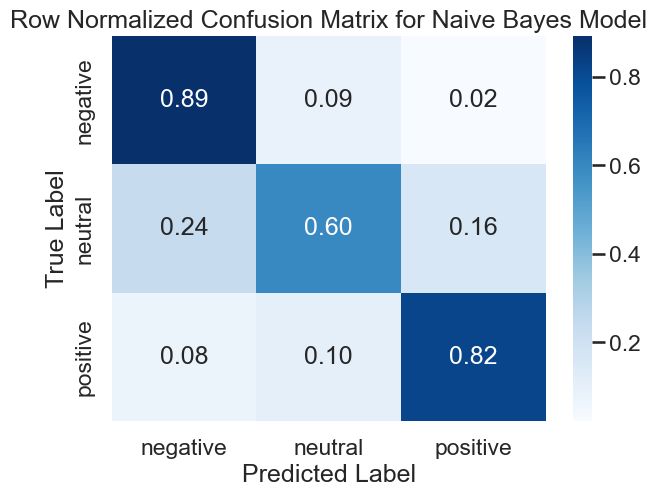

In [130]:
plot_confusion_matrix(nb_model, X_test_vec, y_test_vec, sentiment_titles, normalize=True, model_type='traditional', plot_title='Row Normalized Confusion Matrix for Naive Bayes Model')

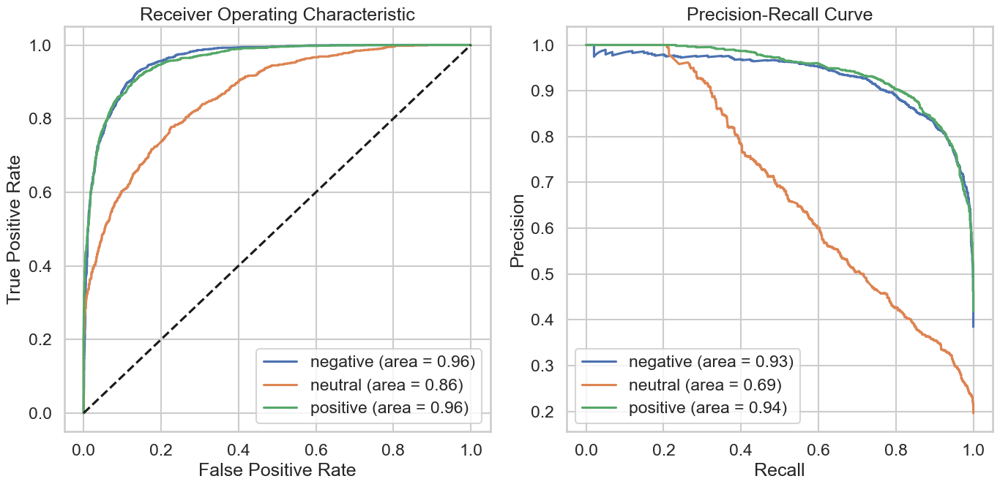

In [89]:
evaluate_model(nb_model, X_test_vec, y_test_vec, sentiment_titles, 'traditional')

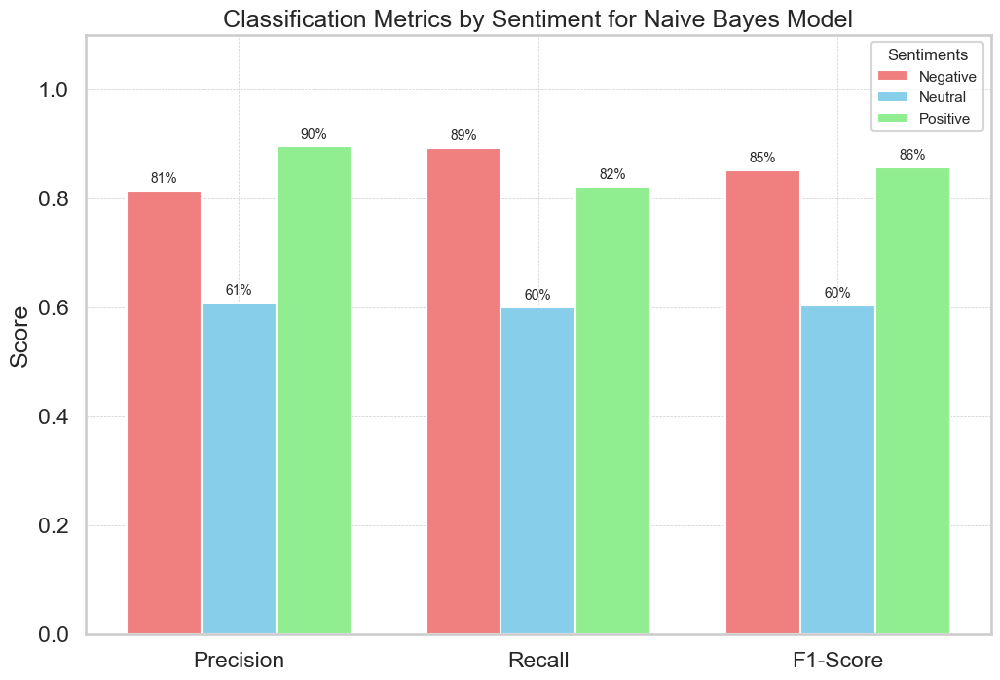

In [129]:
plot_classification_metrics(y_test_vec, y_pred_svm, title="Classification Metrics by Sentiment for Naive Bayes Model")

## BERT model - (Accuracy 86%)

### Configuration

In [91]:
#transformers_logging.set_verbosity_error()  # Reduce clutter from transformers library logs

In [9]:
# setting output dir for hyperparameter tuning process
bert_hyperparametertuning_output_dir = './bert-hyperparameter-tuning-results'
os.makedirs(bert_hyperparametertuning_output_dir, exist_ok=True)

bert_hyperparametertuning_logging_dir = './bert-hyperparameter-tuning-logs'
os.makedirs(bert_hyperparametertuning_logging_dir, exist_ok=True)

# setting output dir for Best Bert model
Bert_Bestmodel_output_dir = './Bert-hyperparameter-tuned-BestModel-results'
os.makedirs(Bert_Bestmodel_output_dir, exist_ok=True)

Bert_Bestmodel_logging_dir = './Bert-hyperparameter-tuned-BestModel-logs'
os.makedirs(Bert_Bestmodel_logging_dir, exist_ok=True)

In [10]:
# Creating Mappings Between Sentiment Labels and Their Corresponding IDs
labels = ["negative", "neutral", "positive"]

label2id = {label: idx for idx, label in enumerate(labels)}
id2label = {idx: label for label, idx in label2id.items()}

In [11]:
# Load a pre-defined configuration for BERT
config = BertConfig.from_pretrained(
    'bert-base-uncased',
    num_labels=3,                     # Number of output labels (for 3 classes)
    id2label=id2label,                # Mapping from IDs to labels
    label2id=label2id,                # Mapping from labels to IDs
    output_hidden_states=False,       # Whether to output hidden states
    output_attentions=False,          # Whether to output attention weights
    hidden_dropout_prob=0.2,          # Dropout rate for fully connected layers
    attention_probs_dropout_prob=0.2  # Dropout rate for attention probabilities
    #max_position_embeddings=128       # Max position embeddings (adjust based on sentence length)
)

# Load the tokenizer for BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Load the model with the custom config for BERT
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', config=config)

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Train, val, test dataset preparing

In [12]:
# Split the dataset into training+validation and test sets (90% train+val, 10% test) with stratification based on labels.
train_val_data, test_data, train_val_labels, test_labels = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Further split the training+validation data into separate training and validation sets (75% train, 25% validation)
# with stratification based on the training+validation labels.
train_texts, val_texts, train_labels, val_labels = train_test_split(train_val_data, train_val_labels, test_size=0.25, random_state=42 , stratify=train_val_labels)

In [13]:
# Reset the indexes of the training, validation, and test datasets to ensure continuous indexing.
# This is useful after splitting the data to remove any remnants of the original indices, preventing potential issues during model training.
train_texts = train_texts.reset_index(drop=True)
val_texts = val_texts.reset_index(drop=True)
test_texts = test_data.reset_index(drop=True)

# Similarly, reset the indexes for the corresponding labels of the training, validation, and test sets.
train_labels = train_labels.reset_index(drop=True)
val_labels = val_labels.reset_index(drop=True)
test_labels = test_labels.reset_index(drop=True)


In [14]:
# Tokenize the training, validation, and test text data using the specified tokenizer.
# The texts are tokenized with truncation and padding applied to ensure uniform sequence lengths.
# The max_length parameter is set to 128 tokens, which standardizes input size across all examples.
train_encodings = tokenizer(train_texts.tolist(), truncation=True, padding=True, max_length=128)
val_encodings = tokenizer(val_texts.tolist(), truncation=True, padding=True, max_length=128)
test_encodings = tokenizer(test_texts.tolist(), truncation=True, padding=True, max_length=128)

In [15]:
# Define a custom PyTorch Dataset class to handle sentiment analysis data.
# The class takes tokenized encodings and corresponding labels as inputs.

class SentimentDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        # Initialize the dataset with encodings and labels
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        # Retrieve a single data item (encoding and label) at the given index (idx).
        # The encoding is converted to a tensor, and the corresponding label is added to the item dictionary.
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        # Return the total number of items in the dataset.
        return len(self.labels)

# Instantiate the SentimentDataset class for the training, validation, and test datasets.
train_dataset = SentimentDataset(train_encodings, train_labels.tolist())
val_dataset = SentimentDataset(val_encodings, val_labels.tolist())
test_dataset = SentimentDataset(test_encodings, test_labels.tolist())


### Compute class weights

In [16]:
# Compute class weights to handle imbalanced datasets, ensuring that minority classes are not underrepresented during training.
# The 'balanced' argument automatically adjusts weights inversely proportional to class frequencies in the training set.
labels = np.unique(train_labels)
class_weights = compute_class_weight('balanced', classes=labels, y=train_labels)

# Convert the computed class weights to a PyTorch tensor, as it will be used in the loss function.
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

'\nmodel.classifier = nn.Linear(model.config.hidden_size, model.config.num_labels)\nmodel.num_labels = config.num_labels\nmodel.loss_fct = nn.CrossEntropyLoss(weight=class_weights_tensor)'

### Compute Metrics Function

In [17]:
# Define a function to compute various evaluation metrics, including accuracy, precision, recall, and F1-score.
# This function is used to assess the performance of the model on the validation or test data.

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    
    # Convert logits to predicted class labels by taking the argmax over the final axis.
    predictions = np.argmax(logits, axis=-1)
    
    # Calculate accuracy, which is the primary metric for model evaluation.
    accuracy = accuracy_score(labels, predictions)
    
    # Compute precision, recall, and F1-score using macro averaging, which treats all classes equally.
    precision, recall, f1, _ = precision_recall_fscore_support(labels, predictions, average='macro')

    # Return a dictionary containing all computed metrics.
    return {
        'accuracy': accuracy,    # Accuracy is the primary metric
        'f1': f1,
        'precision': precision,
        'recall': recall
    }

### Weighted Trainer Class

In [18]:
# Define a custom Trainer class that incorporates class weights into the loss function to handle imbalanced datasets.
# This custom Trainer will override the compute_loss method to ensure that class weights are applied during training.

class WeightedTrainer(Trainer):
    def compute_loss(self, model, inputs, return_outputs=False):
        # Extract the labels from the input data
        labels = inputs.get("labels")
        
        # Perform a forward pass through the model
        outputs = model(**inputs)
        
        # Retrieve the logits (raw, unnormalized predictions) from the model's outputs
        logits = outputs.get("logits")
        
        # Convert logits to a PyTorch tensor if they are not already in tensor format
        if isinstance(logits, np.ndarray):
            logits = torch.tensor(logits)
        
        # Define the loss function with the precomputed class weights, ensuring it matches the device (CPU/GPU) used
        loss_fct = torch.nn.CrossEntropyLoss(weight=class_weights_tensor.to(logits.device))
        
        # Compute the weighted loss using the logits and labels
        loss = loss_fct(logits, labels)
        
        # Return the loss, and optionally the model outputs if return_outputs is True
        return (loss, outputs) if return_outputs else loss


### Hyperparameter Tuning Function

In [72]:
def objective(trial):
    # Define the hyperparameters to tune using Optuna's suggest methods
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 5e-5)
    num_train_epochs = trial.suggest_int('num_train_epochs', 3, 5)
    per_device_train_batch_size = trial.suggest_categorical('per_device_train_batch_size', [16, 32])
    warmup_steps = trial.suggest_int('warmup_steps', 200, 800)

    # Define the TrainingArguments with the current set of hyperparameters
    training_args = TrainingArguments(
        output_dir=bert_hyperparametertuning_output_dir,
        evaluation_strategy="steps",
        eval_steps=250,
        save_steps=500,
        learning_rate=learning_rate,
        per_device_train_batch_size=per_device_train_batch_size,
        per_device_eval_batch_size=32,
        num_train_epochs=num_train_epochs,
        warmup_steps=warmup_steps,
        weight_decay=0.01,
        logging_dir=bert_hyperparametertuning_logging_dir,
        logging_steps=50,
        save_total_limit=1,
        load_best_model_at_end=True,
        metric_for_best_model='accuracy',
        fp16=True  # Enable mixed precision training for faster computations
        #dataloader_num_workers=4  # Speed up data loading
    )
    
    # Initialize the custom WeightedTrainer with the current training and validation datasets
    trainer = WeightedTrainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics
    )

    # Train the model
    trainer.train()

    # Evaluate the model
    eval_results = trainer.evaluate()

    # Return the accuracy as the optimization metric
    return eval_results['eval_accuracy']
    

In [73]:
# Set up a pruner to terminate unpromising trials early, improving optimization efficiency.
# The MedianPruner prunes trials that have an intermediate value lower than the median of previous trials, 
# after a defined number of warmup steps.

pruner = optuna.pruners.MedianPruner(n_warmup_steps=10)

study = optuna.create_study(
    study_name="my_study13", 
    pruner=pruner, # The pruner strategy used to terminate underperforming trials.
    storage="sqlite:///my_study13.db", 
    direction="maximize", # The optimization direction ('maximize' in this case, aiming to maximize the accuracy).
    load_if_exists=True # If a study with the same name exists, it will be loaded instead of creating a new one.
)

[I 2024-08-28 17:30:56,641] Using an existing study with name 'my_study13' instead of creating a new one.


### Hyperparameter Optimization Process with Optuna

In [74]:
# Start the optimization process for the defined study.
study.optimize(objective, n_trials=8)  # Run 8 trials in parallel to find the best hyperparameters

Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.674300,0.569339,0.785285,0.755244,0.760542,0.765153
500,0.507600,0.479929,0.846658,0.808868,0.813145,0.805753
750,0.472800,0.430760,0.842105,0.815184,0.813433,0.823793
1000,0.424800,0.421976,0.867784,0.837153,0.837741,0.837191
1250,0.337200,0.430864,0.867055,0.840287,0.837446,0.844153
1500,0.342200,0.436041,0.878346,0.847144,0.852963,0.842934
1750,0.269000,0.453193,0.873611,0.844898,0.844525,0.845296
2000,0.253200,0.447758,0.874158,0.846307,0.845334,0.847380


[I 2024-08-28 17:35:48,233] Trial 11 finished with value: 0.8783463849936259 and parameters: {'learning_rate': 3.262855867930447e-05, 'num_train_epochs': 4, 'per_device_train_batch_size': 32, 'warmup_steps': 758}. Best is trial 3 with value: 0.8788927335640139.


Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.197400,0.484609,0.877618,0.849684,0.850365,0.849122
500,0.146800,0.605513,0.873793,0.845622,0.845884,0.845364
750,0.186000,0.598129,0.847569,0.823518,0.820594,0.834352
1000,0.108900,0.748990,0.871062,0.839548,0.844273,0.836880
1250,0.120200,0.737408,0.874340,0.842724,0.848395,0.838710
1500,0.154600,0.777289,0.873065,0.837026,0.850971,0.829567
1750,0.185900,0.557350,0.875068,0.845142,0.848254,0.842746
2000,0.210400,0.520144,0.877072,0.850930,0.849331,0.852789


[I 2024-08-28 17:40:38,295] Trial 12 finished with value: 0.8770715716627208 and parameters: {'learning_rate': 3.6443376588182835e-05, 'num_train_epochs': 4, 'per_device_train_batch_size': 32, 'warmup_steps': 796}. Best is trial 3 with value: 0.8788927335640139.


Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.076000,0.806962,0.869787,0.842051,0.841988,0.842579
500,0.080400,1.021269,0.874340,0.841343,0.851211,0.835527
750,0.080500,1.196249,0.858314,0.815428,0.841090,0.805115
1000,0.058200,0.996043,0.869969,0.842130,0.841558,0.842790
1250,0.048800,0.971118,0.866691,0.839989,0.837945,0.842645
1500,0.103700,0.979037,0.877800,0.848548,0.851524,0.846090
1750,0.072300,0.900629,0.872337,0.844196,0.843214,0.845334
2000,0.172900,0.835293,0.873793,0.846282,0.845292,0.847357


[I 2024-08-28 17:45:22,646] Trial 13 finished with value: 0.877800036423238 and parameters: {'learning_rate': 4.1865846507637756e-05, 'num_train_epochs': 4, 'per_device_train_batch_size': 32, 'warmup_steps': 452}. Best is trial 3 with value: 0.8788927335640139.


Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.041200,1.029768,0.879803,0.848855,0.856059,0.843855
500,0.015200,1.115822,0.876889,0.848438,0.850627,0.847116
750,0.036100,1.220628,0.872337,0.837780,0.846980,0.831808
1000,0.033800,1.104888,0.862320,0.835194,0.832013,0.839898
1250,0.021600,1.230472,0.873611,0.841251,0.847008,0.837000
1500,0.033400,1.165035,0.871244,0.844697,0.842326,0.847704
1750,0.076000,0.976630,0.870333,0.842286,0.841477,0.843179
2000,0.171400,0.862132,0.873065,0.843984,0.845073,0.842971


[I 2024-08-28 17:50:06,057] Trial 14 finished with value: 0.8768894554725916 and parameters: {'learning_rate': 2.9889566666804522e-05, 'num_train_epochs': 4, 'per_device_train_batch_size': 32, 'warmup_steps': 765}. Best is trial 3 with value: 0.8788927335640139.


Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.021300,1.142013,0.879621,0.849147,0.855208,0.844794
500,0.001000,1.283466,0.871608,0.845042,0.843175,0.847339
750,0.034700,1.433597,0.866873,0.831706,0.845721,0.823755
1000,0.026800,1.168919,0.873247,0.845928,0.843638,0.848821
1250,0.032100,1.316999,0.871062,0.837088,0.846571,0.831000
1500,0.045500,1.225026,0.875615,0.846738,0.847524,0.846091
1750,0.091000,0.964705,0.869605,0.839529,0.841080,0.838360
2000,0.166700,0.794953,0.875068,0.847354,0.847188,0.847526
2250,0.158100,0.763451,0.877436,0.848736,0.851485,0.846388
2500,0.126700,0.753543,0.877618,0.849207,0.850724,0.847832


[I 2024-08-28 17:56:00,251] Trial 15 finished with value: 0.8776179202331087 and parameters: {'learning_rate': 2.1577662681785216e-05, 'num_train_epochs': 5, 'per_device_train_batch_size': 32, 'warmup_steps': 393}. Best is trial 3 with value: 0.8788927335640139.


Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.001600,1.126203,0.875250,0.846190,0.848497,0.844234
500,0.019600,1.193479,0.867055,0.840891,0.837777,0.845229
750,0.082600,1.261275,0.870333,0.834344,0.848489,0.826368
1000,0.077100,1.085721,0.857585,0.829743,0.826965,0.834597
1250,0.048500,1.041091,0.862320,0.835830,0.832827,0.840130
1500,0.044400,1.218739,0.876161,0.844473,0.855102,0.837983
1750,0.068600,0.973188,0.859406,0.833134,0.829572,0.839254
2000,0.109000,0.965721,0.874886,0.846189,0.848024,0.844562


[I 2024-08-28 18:00:37,654] Trial 16 finished with value: 0.8761609907120743 and parameters: {'learning_rate': 4.895113648442833e-05, 'num_train_epochs': 4, 'per_device_train_batch_size': 32, 'warmup_steps': 703}. Best is trial 3 with value: 0.8788927335640139.


Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.030300,1.174901,0.871426,0.839657,0.848668,0.834089
500,0.037100,1.248610,0.873065,0.844303,0.845864,0.842974
750,0.029700,1.329790,0.877436,0.848224,0.852303,0.845277
1000,0.026100,1.213470,0.870515,0.843492,0.841678,0.845639
1250,0.015500,1.314038,0.868876,0.836889,0.841647,0.833228
1500,0.041500,1.212885,0.860863,0.833341,0.831082,0.836631
1750,0.081400,0.940297,0.866873,0.839261,0.837537,0.841272
2000,0.124600,0.853241,0.870698,0.844780,0.842136,0.848269
2250,0.134500,0.890412,0.878164,0.850941,0.851853,0.850084
2500,0.074900,0.883699,0.875250,0.847138,0.849384,0.845163


[I 2024-08-28 18:06:25,634] Trial 17 finished with value: 0.8752504097614278 and parameters: {'learning_rate': 3.673120111215922e-05, 'num_train_epochs': 5, 'per_device_train_batch_size': 32, 'warmup_steps': 432}. Best is trial 3 with value: 0.8788927335640139.


Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.004900,1.128446,0.880532,0.851372,0.857536,0.846831
500,0.023000,1.203695,0.874340,0.847440,0.846529,0.848413
750,0.004400,1.413960,0.876889,0.848704,0.850546,0.847050
1000,0.000100,1.489088,0.878346,0.846578,0.855084,0.840956
1250,0.001300,1.485312,0.878529,0.848157,0.854870,0.843248
1500,0.010900,1.449159,0.878164,0.848643,0.852328,0.845870
1750,0.021900,1.334089,0.869423,0.842964,0.842111,0.843918
2000,0.029100,1.318519,0.878164,0.850586,0.852044,0.849319


[I 2024-08-28 18:11:10,121] Trial 18 finished with value: 0.8783463849936259 and parameters: {'learning_rate': 2.2249434082071364e-05, 'num_train_epochs': 4, 'per_device_train_batch_size': 32, 'warmup_steps': 535}. Best is trial 3 with value: 0.8788927335640139.


In [75]:
print("Best hyperparameters: ", study.best_params)
print("Best accuracy: ", study.best_value)

Best hyperparameters:  {'learning_rate': 1.4746704781917106e-05, 'num_train_epochs': 3, 'per_device_train_batch_size': 32, 'warmup_steps': 415}
Best accuracy:  0.8788927335640139


### Train the Best model

In [104]:
# Retrieve the best hyperparameters found during the Optuna study.
best_hyperparameters = study.best_params

# Set up the TrainingArguments with the best hyperparameters.
# These arguments configure the training process, including learning rate, batch sizes, number of epochs, etc.
training_args = TrainingArguments(
    output_dir=Bert_Bestmodel_output_dir,
    evaluation_strategy="steps",
    eval_steps=250,
    save_steps=500,
    learning_rate=best_hyperparameters['learning_rate'],
    per_device_train_batch_size= best_hyperparameters['per_device_train_batch_size'], 
    per_device_eval_batch_size= 32,
    num_train_epochs=best_hyperparameters['num_train_epochs'],
    warmup_steps= best_hyperparameters['warmup_steps'],
    weight_decay=0.01,
    logging_dir=Bert_Bestmodel_logging_dir,
    logging_steps=50,
    save_total_limit=1,
    load_best_model_at_end=True,
    metric_for_best_model='accuracy'
)

# Initialize the custom WeightedTrainer with the best hyperparameters.
trainer = WeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics
)

# Train the model with the best hyperparameters.
trainer.train()

# Evaluate the trained model on the validation dataset.
eval_results = trainer.evaluate()

print("Final accuracy: ", eval_results['eval_accuracy'])

Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
250,0.699500,0.583093,0.817520,0.772482,0.775343,0.770469
500,0.454700,0.504220,0.803861,0.781832,0.788296,0.798810
750,0.491300,0.467209,0.853761,0.816927,0.821829,0.814146
1000,0.463400,0.437319,0.853396,0.823119,0.821075,0.825767
1250,0.415900,0.451687,0.855946,0.827157,0.824433,0.831076
1500,0.465400,0.438748,0.849572,0.821044,0.818334,0.826849
1750,0.442000,0.414930,0.852486,0.827722,0.824291,0.837117
2000,0.403100,0.425134,0.863777,0.833392,0.833227,0.833578
2250,0.365400,0.438722,0.865780,0.836671,0.835776,0.837658
2500,0.332400,0.429573,0.862867,0.833903,0.831878,0.836423


Final accuracy:  0.8668730650154799


### save the model info

In [109]:
# Save training metrics
with open(os.path.join(Bert_Bestmodel_output_dir, 'metrics.pkl'), 'wb') as f:
    #pickle.dump(metrics, f)
    pickle.dump(trainer.state.log_history, f)

# Evaluation the model

### Load the model info

In [19]:
# Load metrics
with open(os.path.join(Bert_Bestmodel_output_dir, 'metrics.pkl'), 'rb') as f:
    metrics = pickle.load(f)

### plot learning metrics

In [111]:
steps = [m['step'] for m in metrics if 'eval_loss' in m]
accuracy = [m['eval_accuracy'] for m in metrics if 'eval_accuracy' in m]
f1 = [m['eval_f1'] for m in metrics if 'eval_f1' in m]
precision = [m['eval_precision'] for m in metrics if 'eval_precision' in m]
recall = [m['eval_recall'] for m in metrics if 'eval_recall' in m]

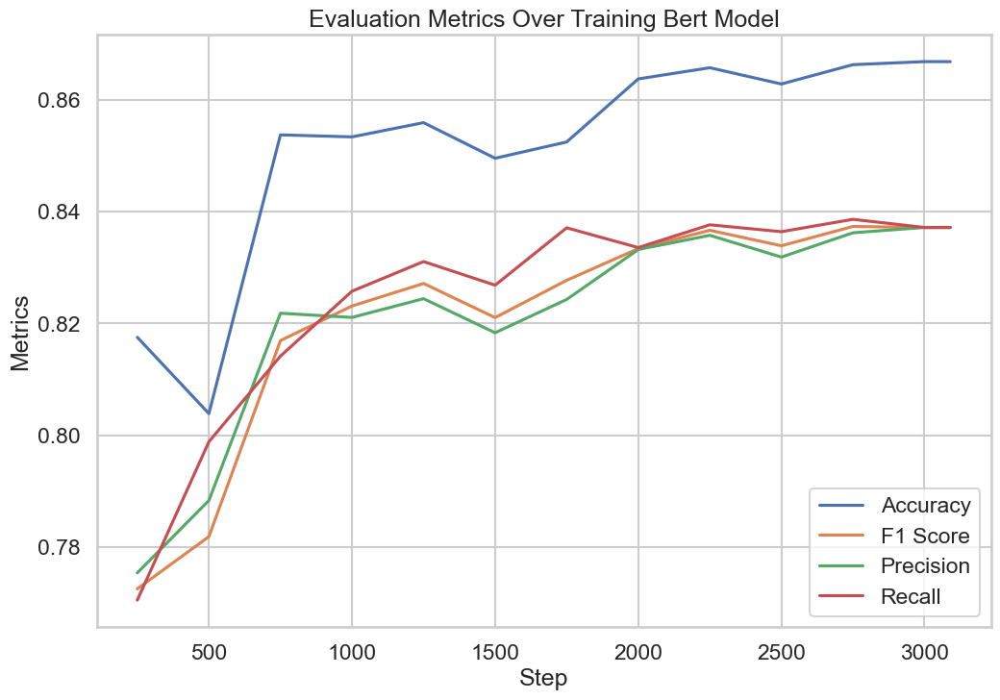

In [113]:
# plot metrics
plt.figure(figsize=(12, 8))
plt.plot(steps, accuracy, label='Accuracy')
plt.plot(steps, f1, label='F1 Score')
plt.plot(steps, precision, label='Precision')
plt.plot(steps, recall, label='Recall')
plt.xlabel('Step')
plt.ylabel('Metrics')
plt.title('Evaluation Metrics Over Training Bert Model')
plt.legend()
plt.grid(True)
plt.savefig(os.path.join(Bert_Bestmodel_output_dir, 'metrics_plot.png'))
plt.show()

### confusion matrix

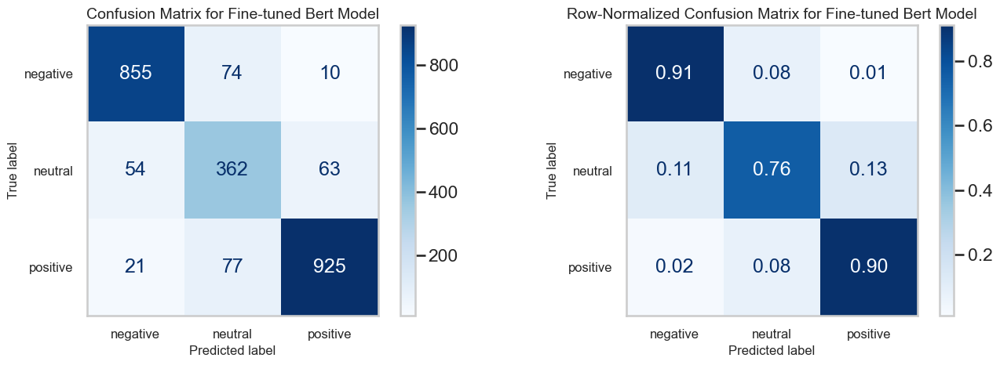

In [124]:
# Predict the labels for the test dataset using the trained model
predictions = trainer.predict(test_dataset)

# Convert the logits to predicted class labels by taking the argmax over the last axis
pred_labels = np.argmax(predictions.predictions, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(test_labels, pred_labels, labels=[0, 1, 2])

# Compute row-wise percentages
row_sums = cm.sum(axis=1)
cm_row_percentage = cm / row_sums[:, np.newaxis]  # Broadcasting to divide each row element

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 5), dpi=100)

# Plot the raw confusion matrix without adding an extra color bar
disp1 = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['negative', 'neutral', 'positive'])
disp1.plot(cmap=plt.cm.Blues, ax=axes[0], values_format='d')  # 'd' for integer format
axes[0].set_title('Confusion Matrix for Fine-tuned Bert Model', fontsize=14)
axes[0].grid(False)  # Disable grid

# Plot the row-normalized confusion matrix without adding an extra color bar
disp2 = ConfusionMatrixDisplay(confusion_matrix=cm_row_percentage, 
                               display_labels=['negative', 'neutral', 'positive'])
disp2.plot(cmap=plt.cm.Blues, ax=axes[1], values_format='.2f')  # Show percentages with 2 decimals
axes[1].set_title('Row-Normalized Confusion Matrix for Fine-tuned Bert Model', fontsize=14)
axes[1].grid(False)  # Disable grid

# Adjust font sizes for axis labels and ticks
for ax in axes:
    ax.xaxis.label.set_size(12)
    ax.yaxis.label.set_size(12)
    ax.tick_params(axis='both', which='major', labelsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


### Classification report and metrics

In [121]:
# Compute precision, recall, f1-score
report = classification_report(test_labels, pred_labels, target_names=['negative', 'neutral', 'positive'])
print(report)

              precision    recall  f1-score   support

    negative       0.92      0.91      0.91       939
     neutral       0.71      0.76      0.73       479
    positive       0.93      0.90      0.92      1023

    accuracy                           0.88      2441
   macro avg       0.85      0.86      0.85      2441
weighted avg       0.88      0.88      0.88      2441



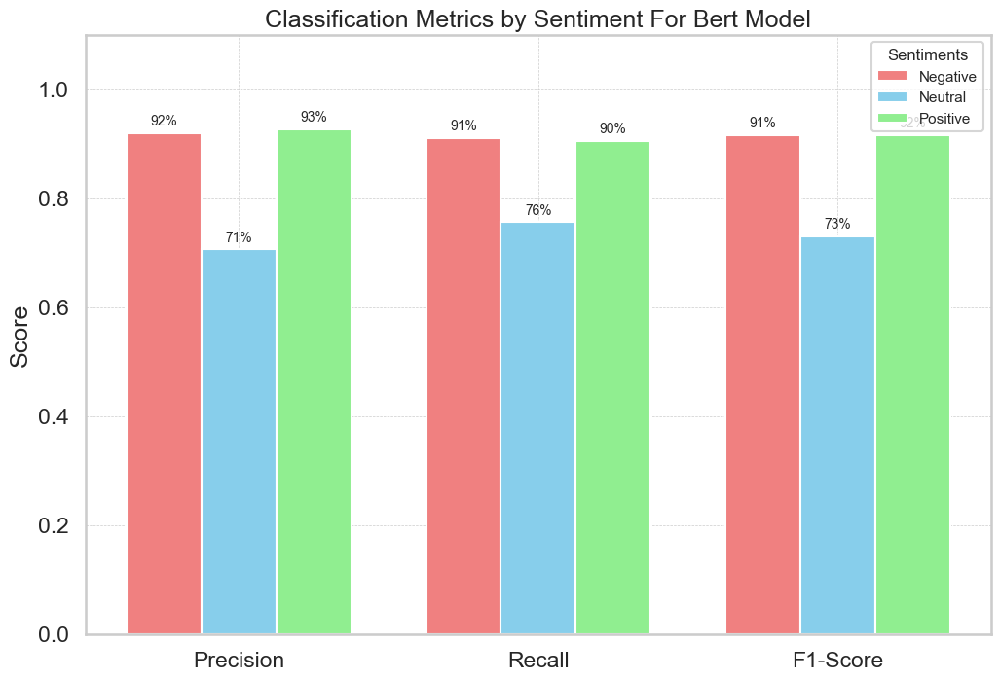

In [122]:
# Plot detailed classification metrics (e.g., precision, recall, F1-score) by sentiment class for the BERT model.
# This function visualizes how well the model performs across different classes (e.g., negative, neutral, positive).
plot_classification_metrics(test_labels, pred_labels, title="Classification Metrics by Sentiment For Bert Model")

### model output sample test

##### examine the True Negative sentiments 

##### examine the True Positive sentiments 

# Interpreting the model

## SHAP

In [20]:
# Load the saved tokenizer and model
model_path = os.path.join(Bert_Bestmodel_output_dir, 'checkpoint-3000')  # Path to the directory where the model is saved
model = BertForSequenceClassification.from_pretrained(model_path)

# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [21]:
pred = transformers.pipeline("sentiment-analysis", model=model, tokenizer=tokenizer, device=0, return_all_scores=False) # device=0 for use GPU, -1 for CPU!
shap_explainer = shap.Explainer(pred)

In [45]:
train_labels[:100].value_counts()

label
2    42
0    38
1    20
Name: count, dtype: int64

In [54]:
# Create a new review for do the explainablity
new_review = "The cafe was spotlessly clean and the layout was quite appealing. However, the order was not only incorrect but also delayed, and the coffee, despite being served promptly thereafter, was disappointingly bitter. To make matters worse, the server seemed indifferent to our concerns. Despite these issues, the staff tried to manage the situation with professionalism."

# Convert the new review into a Series
new_review_series = pd.Series([new_review])

# Concatenate the new review with the existing Series
sample_reviews = pd.concat([new_review_series, train_texts[:200]], ignore_index=True)
sample_reviews

0      The cafe was spotlessly clean and the layout w...
1      its a hit or miss with the people that work he...
2      waited 30 min in the drive through and did not...
3      very quick very courteous food very hot! very ...
4      they had a broken latte machine the kiosk alre...
                             ...                        
196    avoid it if you can the service is terrible so...
197                                          bad service
198                                            excellent
199    we use the mcdonalds app on our phones they ha...
200                                              neutral
Length: 201, dtype: object

In [55]:
shap_values_overall = shap_explainer(list(sample_reviews))

PartitionExplainer explainer:  63%|███████████████████████████████▎                  | 126/201 [03:35<02:22,  1.90s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 202it [06:01,  1.82s/it]                                                                 


In [ ]:
shap.plots.text(shap_values_overall)

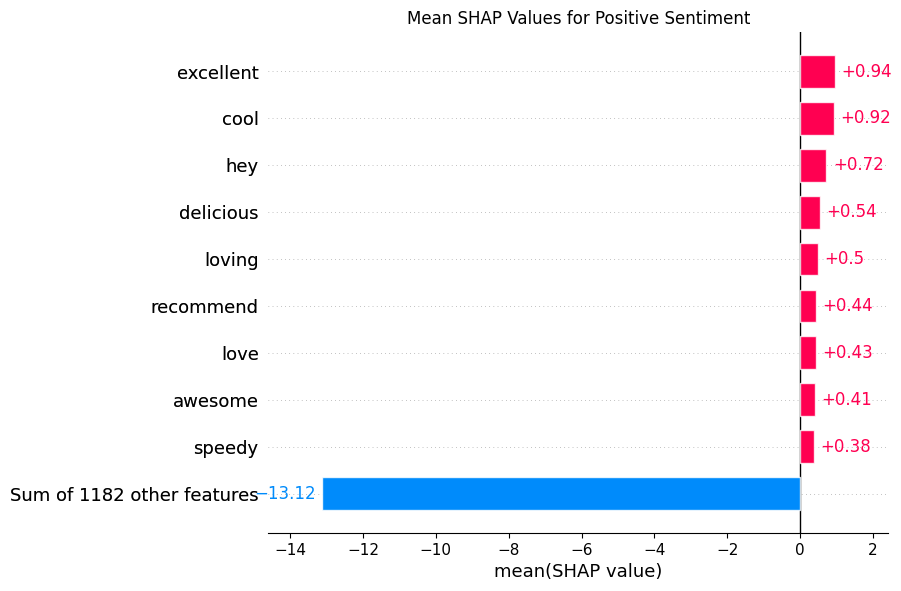

In [57]:
plt.title("Mean SHAP Values for Positive Sentiment")
shap.plots.bar(shap_values_overall[:, :, "positive"].mean(0))
plt.show()  

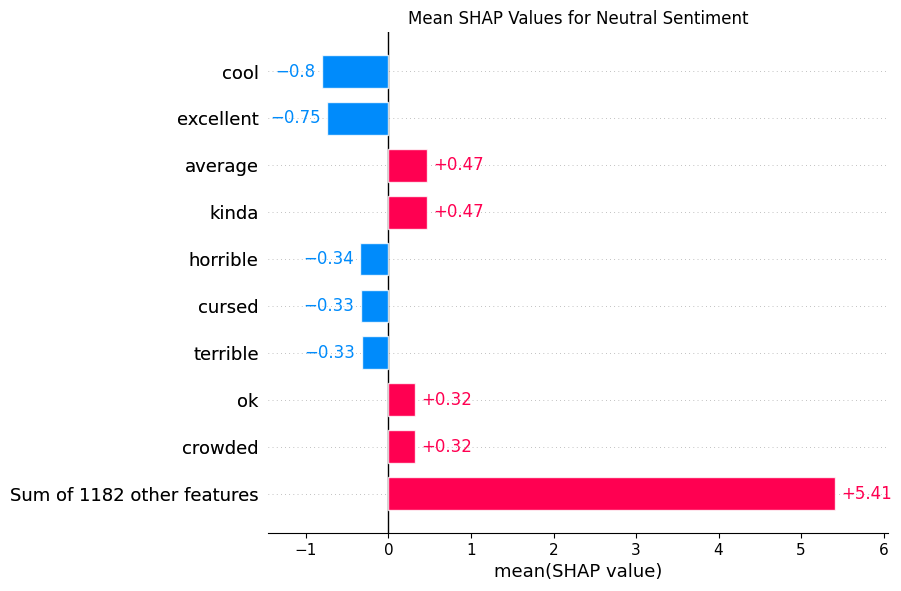

In [58]:
plt.title("Mean SHAP Values for Neutral Sentiment")
shap.plots.bar(shap_values_overall[:, :, "neutral"].mean(0))
plt.show()

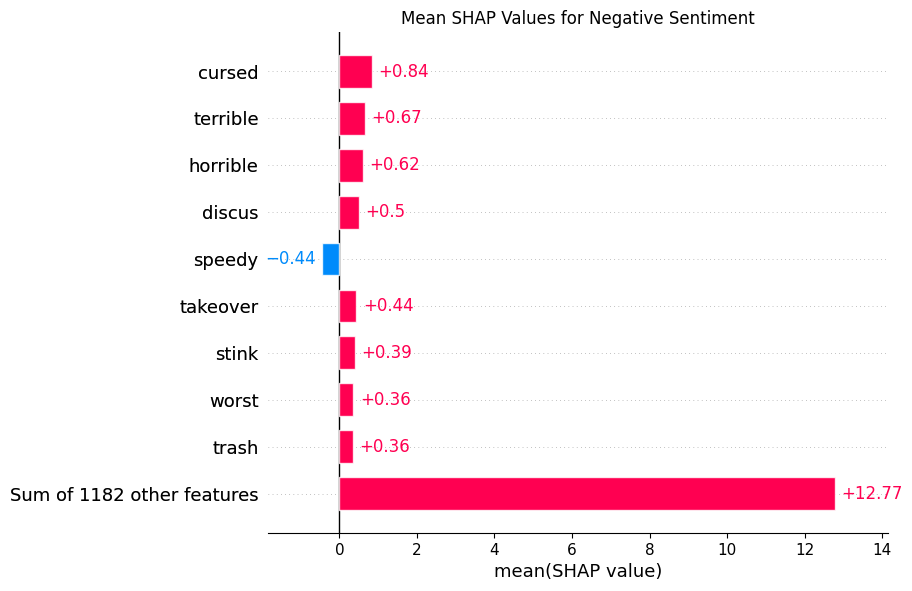

In [59]:
plt.title("Mean SHAP Values for Negative Sentiment")
shap.plots.bar(shap_values_overall[:, :, "negative"].mean(0))
plt.show()

### misclassifying explainable by SHAP

In [53]:
from torch.utils.data import DataLoader

# Create a DataLoader for the test dataset
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [54]:
# Make sure the model is in evaluation mode
model.eval()

# Store predictions and actual labels
pred_labels = []
actual_labels = []

# Disable gradient calculation for efficiency
with torch.no_grad():
    for batch in test_loader:
        # Move batch to the same device as the model
        batch = {key: val.to(model.device) for key, val in batch.items()}
        
        # Get model predictions
        outputs = model(**batch)
        logits = outputs.logits
        
        # Get predicted labels
        predictions = torch.argmax(logits, dim=-1)
        
        # Append predictions and actual labels
        pred_labels.extend(predictions.cpu().numpy())
        actual_labels.extend(batch['labels'].cpu().numpy())

# Convert to numpy arrays for easier comparison
pred_labels = np.array(pred_labels)
actual_labels = np.array(actual_labels)


In [55]:
# Compare predictions with actual labels
incorrect_predictions_mask = pred_labels != actual_labels
# Identify incorrect predictions
incorrect_predictions = [(test_texts[i], pred, actual) for i, (pred, actual) in enumerate(zip(pred_labels, actual_labels)) if pred != actual]

In [56]:
# Print some of the incorrect predictions
for text, pred, actual in incorrect_predictions[:10]:  # Show first 10 incorrect predictions
    print(f"Text: {text}\nPredicted: {id2label[pred]}, Actual: {id2label[actual]}\n")

Text: they are very good
Predicted: positive, Actual: neutral

Text: one of the best places to eat
Predicted: positive, Actual: neutral

Text: ate there last nite food was good service was great my order was up b4 i could fill my drink looks like any typical mcds not sure bout all the flap about remodling
Predicted: neutral, Actual: positive

Text: fast service but if you want straws you have to ask for them in santa monica they give you a paper straw so if you have a resusable straw i recomend bringing one selfservice systems are installed to reduce waiting time
Predicted: neutral, Actual: positive

Text: doing their best for no man and the food is still the same level of addicting no drivethru and right next to the beach it is usually teeming with people and it is usually a little busy kiosks available on this trip the payment option for me was unavailable on the kiosk
Predicted: neutral, Actual: positive

Text: the food tasted fresh i asked for mac sauce on my burger but instead i g

In [57]:
incorrect_indices = [i for i, incorrect in enumerate(incorrect_predictions_mask) if incorrect]

# Extract the incorrect texts
incorrect_texts = [test_texts[i] for i in incorrect_indices]

# Tokenize the incorrect texts
incorrect_encodings = tokenizer(incorrect_texts, truncation=True, padding=True, max_length=128, return_tensors="pt")

# Move the encodings to the same device as the model
incorrect_encodings = {key: val.to(model.device) for key, val in incorrect_encodings.items()}


In [58]:
shap_values_misclassified = shap_explainer(list(incorrect_texts)[:5])

PartitionExplainer explainer: 101it [03:10,  1.99s/it]                                                                 


In [ ]:
shap.plots.text(shap_values_misclassified)

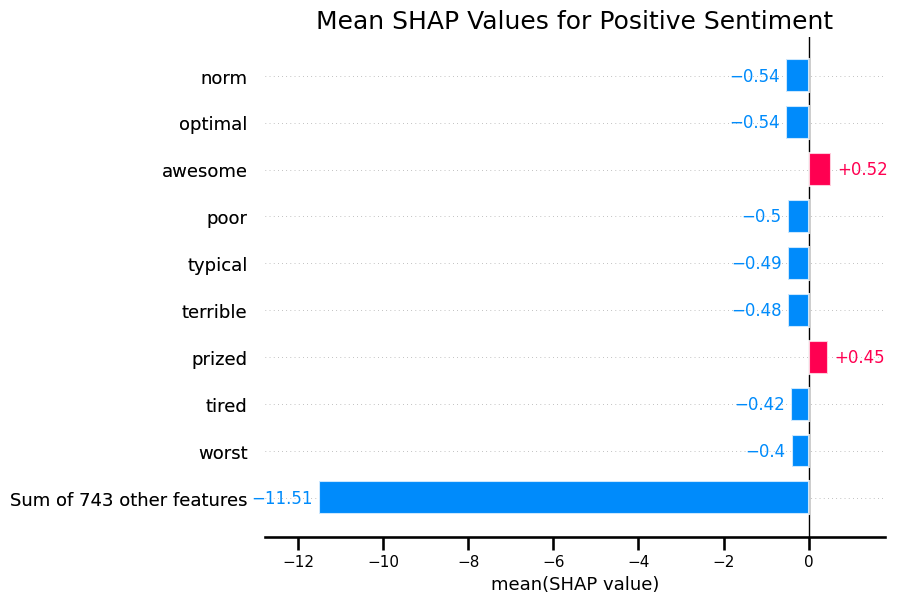

In [61]:
plt.title("Mean SHAP Values for Misclassified Positive Sentiment Predictions")
shap.plots.bar(shap_values_misclassified[:, :, "positive"].mean(0))
plt.show()

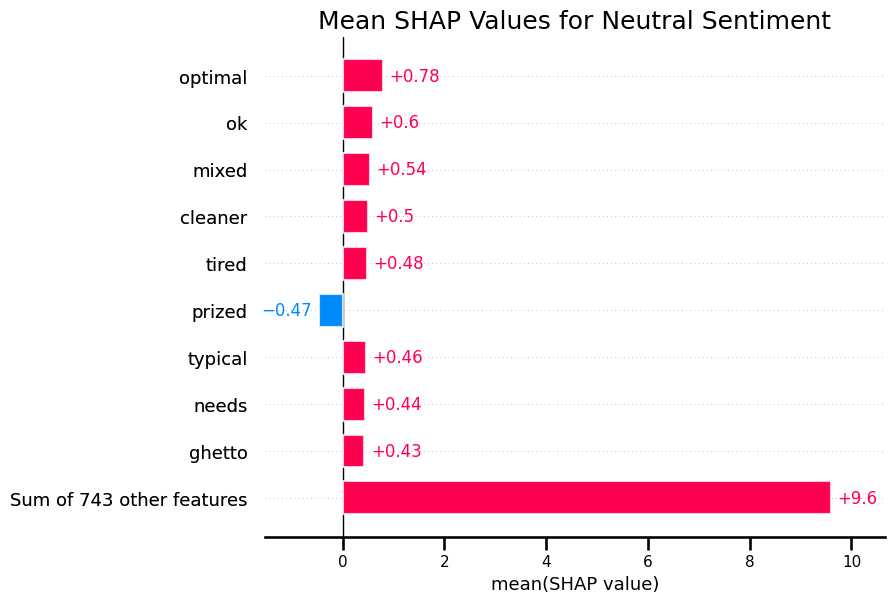

In [67]:
plt.title("Mean SHAP Values for Misclassified neutral Sentiment Predictions")
shap.plots.bar(shap_values_misclassified[:, :, "neutral"].mean(0))
plt.show()

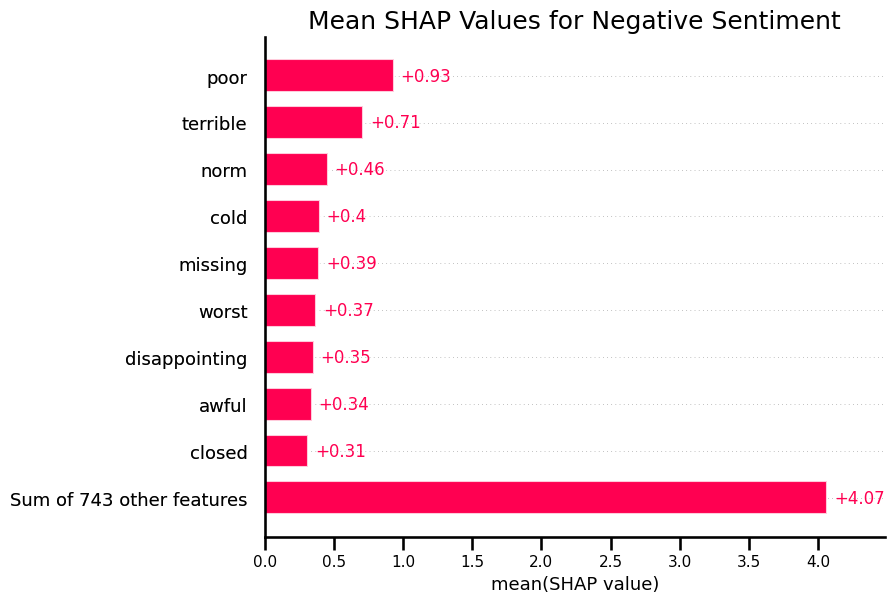

In [60]:
plt.title("Mean SHAP Values for Misclassified Positive Sentiment Predictions")
shap.plots.bar(shap_values_misclassified[:, :, "negative"].mean(0))
plt.show()

## LIME

In [40]:
# Load the saved tokenizer and model
model_path = os.path.join(Bert_Bestmodel_output_dir, 'checkpoint-3000')  # Path to the directory where the model is saved
model = BertForSequenceClassification.from_pretrained(model_path)

# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [41]:
def predict_proba(texts):
    torch.cuda.empty_cache()  # Clear cache before each inference
    probabilities = []
    for text in texts:
        inputs = tokenizer([text], return_tensors='pt', padding=True, truncation=True).to(device)
        with torch.no_grad():
            outputs = model(**inputs)
            logits = outputs.logits
            prob = torch.nn.functional.softmax(logits, dim=1)
            probabilities.append(prob.cpu().numpy())
    return np.vstack(probabilities)


In [43]:
# Create an explainer object
Lime_explainer = LimeTextExplainer(class_names=['Negative', 'Neutral', 'Positive'])

In [60]:
# List to store explanations
explanations = []

Reviews = sample_reviews[0:5]

# Process each instance in the text list
for review in Reviews:
    exp = Lime_explainer.explain_instance(review, predict_proba, num_features=10, top_labels=3)
    explanations.append(exp)
    # To visualize immediately in Jupyter Notebook:
    exp.show_in_notebook(text=True)


## attention mechanism

In [152]:
# Example usage
#text = 'very quick and delicious food, however was too hot. thanks!'
#text = 'The new cafe in town offers a variety of gourmet dishes, which, despite being slightly pricey, provide a delightful culinary experience. The staff is welcoming and attentive, making every visit feel special. However, the ambiance, while generally pleasant, can be too noisy during peak hours, which some patrons find off-putting.'
text = 'The restaurant’s new chef creates innovative dishes that are visually stunning but quite expensive'

# Tokenizing and extracting tokens
encoded_input = tokenizer(text, return_tensors="pt")
tokens = tokenizer.convert_ids_to_tokens(encoded_input['input_ids'][0])

# Ensure everything is on the same device
encoded_input = {k: v.to(device) for k, v in encoded_input.items()}

In [153]:
# Assume 'model' is already loaded and moved to the appropriate device
model.eval()
with torch.no_grad():
    outputs = model(**encoded_input, output_attentions=True)

# Extract the last layer's attention (mean across all heads)
attention = outputs.attentions[-1]  # Get the last layer's attention
attention_mean = attention.squeeze(0).mean(0).cpu().numpy()

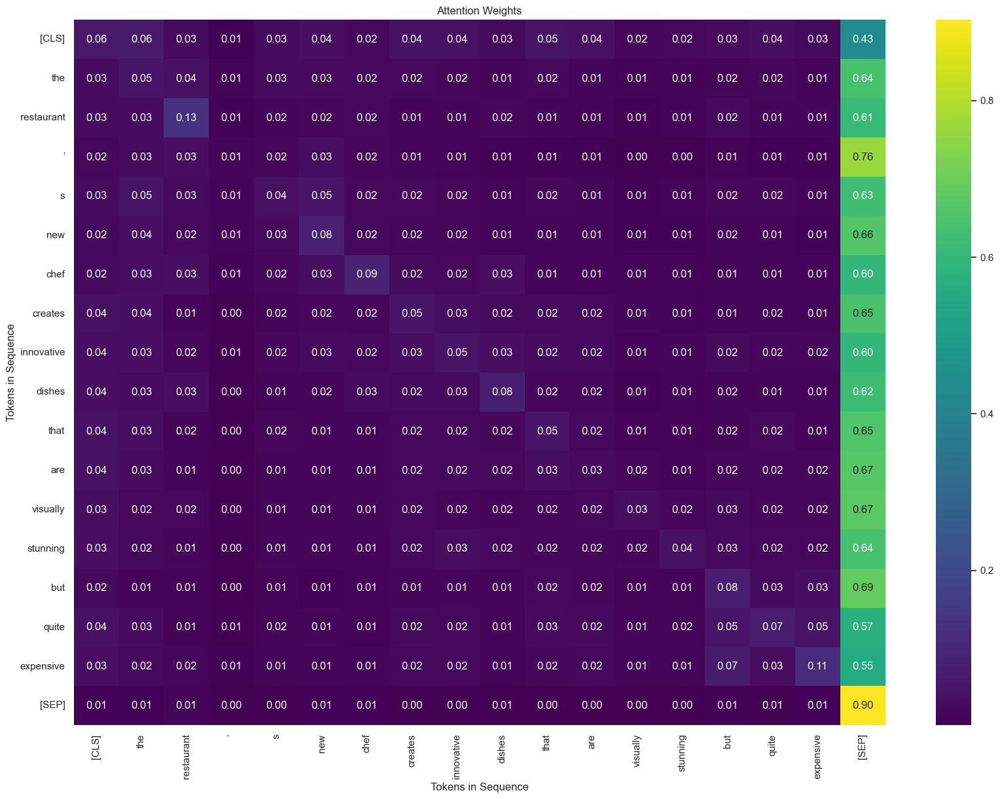

In [154]:
plt.figure(figsize=(20, 14))
ax = sns.heatmap(attention_mean, annot=True, fmt=".2f", cmap='viridis', xticklabels=tokens, yticklabels=tokens)
plt.title('Attention Weights')
plt.xlabel('Tokens in Sequence')
plt.ylabel('Tokens in Sequence')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

## Factor analysis

In [81]:
# Vectorize the reviews without the sentiment column
vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_vec = vectorizer.fit_transform(df['cleaned_review'])

# Convert to DataFrame for analysis
tfidf_df = pd.DataFrame(X_vec.toarray(), columns=vectorizer.get_feature_names_out())

# Add the sentiment column back to the DataFrame
tfidf_df['sentiment'] = df['sentiment'].values

# Calculate the mean TF-IDF score for each sentiment
positive_keywords = tfidf_df[tfidf_df['sentiment'] == 'positive'].drop('sentiment', axis=1).mean().sort_values(ascending=False)
neutral_keywords = tfidf_df[tfidf_df['sentiment'] == 'neutral'].drop('sentiment', axis=1).mean().sort_values(ascending=False)
negative_keywords = tfidf_df[tfidf_df['sentiment'] == 'negative'].drop('sentiment', axis=1).mean().sort_values(ascending=False)

In [83]:
# Categorize the factors manually or using a pre-defined dictionary of keywords
'''
seed_words = {
    'product_quality': ['taste', 'freshness', 'flavor'],
    'customer_service': ['service', 'staff', 'helpful'],
    'cleanliness': ['clean', 'hygiene', 'sanitize'],
    'price': ['price', 'expensive', 'cheap'],
    'ambiance': ['ambiance', 'atmosphere', 'decor'],
    'convenience': ['convenience', 'location', 'accessible'],
    'speed_of_service': ['speed', 'wait', 'prompt'],
    'order_accuracy': ['accuracy', 'mistake', 'correct']
}
'''

seed_words = {
    'product_quality': ['taste', 'delicious', 'fresh', 'quality', 'food', 'flavor', 'tasty', 'yummy', 'stale', 'cold', 'hot', 'portion', 'meal', 'dish', 'ingredient', 'cooked', 'undercooked', 'overcooked'],
    'customer_service': ['service', 'staff', 'friendly', 'helpful', 'attentive', 'rude', 'polite', 'slow', 'quick', 'wait', 'manager', 'employee', 'cashier', 'order', 'mistake', 'fix', 'resolve', 'assistance'],
    'cleanliness': ['clean', 'hygiene', 'neat', 'dirty', 'messy', 'sanitize', 'filthy', 'spotless', 'restroom', 'bathroom', 'table', 'floor', 'garbage', 'trash', 'smell', 'odor'],
    'price': ['price', 'expensive', 'cheap', 'value', 'cost', 'affordable', 'reasonable', 'overpriced', 'worth', 'deal', 'discount', 'offer', 'promotion'],
    'ambiance': ['ambiance', 'atmosphere', 'environment', 'decor', 'music', 'noise', 'loud', 'quiet', 'comfortable', 'seating', 'space', 'crowded', 'busy', 'calm', 'lighting', 'design'],
    'convenience': ['location', 'parking', 'drive-thru', 'accessible', 'convenient', 'close', 'near', 'far', 'distance', 'hours', 'open', 'close', 'availability', 'wait', 'line'],
    'speed_of_service': ['quick', 'fast', 'slow', 'wait', 'delay', 'prompt', 'timely', 'speed', 'efficient', 'time', 'minute', 'hour'],
    'order_accuracy': ['order', 'mistake', 'wrong', 'correct', 'accuracy', 'error', 'missing', 'add', 'remove', 'special', 'instruction', 'note']
}

In [84]:
# Load the GloVe model
glove_model = api.load("glove-wiki-gigaword-100")  # Using a 100-dimensional GloVe model

def expand_categories(seed_words, model, top_n=10):
    expanded_categories = {}
    for category, seeds in seed_words.items():
        expanded_keywords = set(seeds)
        for seed in seeds:
            # Most similar words based on the GloVe vectors
            if seed in model:
                similar_words = model.most_similar(seed, topn=top_n)
                expanded_keywords.update([word for word, _ in similar_words])
        expanded_categories[category] = list(expanded_keywords)
    return expanded_categories

factor_categories = expand_categories(seed_words, glove_model)

[=========-----------------------------------------] 18.3% 23.4/128.1MB downloaded

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



[========================--------------------------] 48.8% 62.6/128.1MB downloaded

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



[=======================================-----------] 78.6% 100.6/128.1MB downloaded

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



[==================================================] 100.0% 128.1/128.1MB downloaded


In [85]:
positive_factors = positive_keywords.head(100).index.tolist()
neutral_factors = neutral_keywords.head(100).index.tolist()
negative_factors = negative_keywords.head(100).index.tolist()

# Function to categorize factors
def categorize_factors(keywords, factor_categories):
    categorized_factors = {category: [] for category in factor_categories.keys()}
    for keyword in keywords:
        for category, terms in factor_categories.items():
            if any(term in keyword for term in terms):
                categorized_factors[category].append(keyword)
    return categorized_factors

positive_categorized = categorize_factors(positive_factors, factor_categories)
neutral_categorized = categorize_factors(neutral_factors, factor_categories)
negative_categorized = categorize_factors(negative_factors, factor_categories)

In [86]:
print("Positive Factors:\n", positive_categorized,"\n")
print("Neutral Factors:\n", neutral_categorized,"\n")
print("Negative Factors:\n", negative_categorized)

Positive Factors:
 {'product_quality': ['excellent', 'good', 'great', 'service', 'food', 'nice', 'quick', 'fresh', 'fast service', 'hot', 'good service', 'great service', 'good food', 'breakfast', 'coffee', 'customer service', 'delicious', 'well', 'fast food', 'great food', 'eat', 'great place', 'food good', 'quick service', 'area', 'price', 'excellent service', 'meal', 'friendly service', 'good place', 'nice place', 'service good', 'always good', 'service great', 'tasty', 'little', 'great customer', 'cool'], 'customer_service': ['good', 'service', 'fast', 'nice', 'friendly', 'staff', 'quick', 'fast service', 'good service', 'great service', 'order', 'good food', 'customer', 'location', 'breakfast', 'customer service', 'fast food', 'go', 'get', 'friendly staff', 'employee', 'got', 'food good', 'quick service', 'helpful', 'fast friendly', 'excellent service', 'everything', 'friendly service', 'good place', 'easy', 'work', 'nice place', 'service good', 'always good', 'service great', 'gr

In [87]:
# Function to identify factors in reviews
def identify_factors(review, factor_categories):
    review_factors = []
    for category, terms in factor_categories.items():
        if any(term in review for term in terms):
            review_factors.append(category)
    return review_factors

df['factors'] = df['cleaned_review'].apply(lambda x: identify_factors(x, factor_categories))

In [89]:
# Initialize a dictionary to hold sentiment counts for each factor
factor_sentiment_counts = {category: {'positive': 0, 'neutral': 0, 'negative': 0} for category in factor_categories.keys()}

# Update the counts based on the sentiment and identified factors
for index, row in df.iterrows():
    for factor in row['factors']:
        factor_sentiment_counts[factor][row['sentiment']] += 1

# Convert counts to DataFrame for better analysis
factor_sentiment_df = pd.DataFrame(factor_sentiment_counts).T
factor_sentiment_df['total'] = factor_sentiment_df.sum(axis=1)

# Calculate the proportion of each sentiment for each factor
factor_sentiment_df['positive_proportion'] = factor_sentiment_df['positive'] / factor_sentiment_df['total']
factor_sentiment_df['neutral_proportion'] = factor_sentiment_df['neutral'] / factor_sentiment_df['total']
factor_sentiment_df['negative_proportion'] = factor_sentiment_df['negative'] / factor_sentiment_df['total']

factor_sentiment_df = factor_sentiment_df.sort_values(by='total', ascending=False)

# Display the DataFrame
factor_sentiment_df

,positive,neutral,negative,total,positive_proportion,neutral_proportion,negative_proportion
customer_service,6229,3008,8316,17553,0.354868,0.171367,0.473765
convenience,6219,2889,7857,16965,0.366578,0.170292,0.463130
product_quality,8174,2532,5838,16544,0.494076,0.153046,0.352877
speed_of_service,5348,2731,7391,15470,0.345701,0.176535,0.477763
order_accuracy,2536,1801,6533,10870,0.233303,0.165685,0.601012
cleanliness,2948,1431,4243,8622,0.341916,0.165971,0.492113
ambiance,2056,1235,3100,6391,0.321702,0.193240,0.485057
price,1425,851,3032,5308,0.268463,0.160324,0.571213


<Figure size 3000x1200 with 0 Axes>

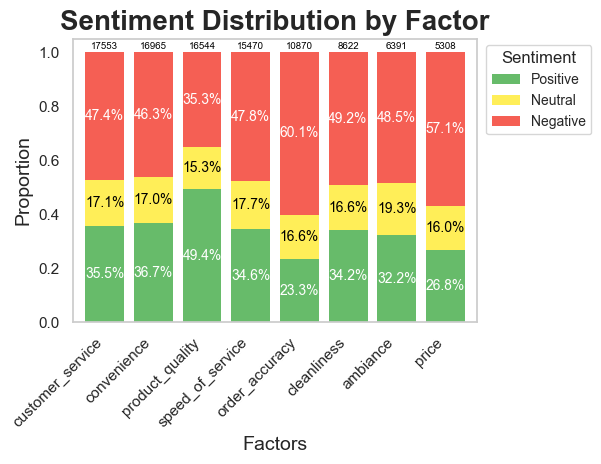

In [90]:
# Plot factor sentiment distribution with enhancements
def plot_factor_sentiment_distribution(factor_sentiment_df):
    # Sorting the factors by total mentions for better visualization
    sorted_df = factor_sentiment_df.sort_values(by='total', ascending=False)
    
    # Setting the style and palette for the plot
    sns.set(style="whitegrid")
    plt.figure(figsize=(30, 12))
    
    # Creating a stacked bar plot
    ax = sorted_df[['positive_proportion', 'neutral_proportion', 'negative_proportion']].plot(
        kind='bar',
        stacked=True,
        color=['#4caf50', '#ffeb3b', '#f44336'],
        edgecolor='none',
        width=0.8,
        alpha=0.85
    )
    
    # Set x-ticks
    ax.set_xticklabels(sorted_df.index, rotation=45, horizontalalignment='right')
    
    # Adding titles and labels
    plt.title('Sentiment Distribution by Factor', fontsize=20, weight='bold')
    plt.xlabel('Factors', fontsize=14)
    plt.ylabel('Proportion', fontsize=14)
    
    # Adding a legend with better positioning and labels
    plt.legend(['Positive', 'Neutral', 'Negative'], loc='upper right', bbox_to_anchor=(1.3, 1), fontsize=10, title='Sentiment')
    
    # Adding data labels for better readability
    for idx, row in enumerate(sorted_df.itertuples()):
        ax.text(idx, row.positive_proportion / 2, f"{row.positive_proportion:.1%}", ha='center', va='center', fontsize=10, color='white')
        ax.text(idx, row.positive_proportion + (row.neutral_proportion / 2), f"{row.neutral_proportion:.1%}", ha='center', va='center', fontsize=10, color='black')
        ax.text(idx, row.positive_proportion + row.neutral_proportion + (row.negative_proportion / 2), f"{row.negative_proportion:.1%}", ha='center', va='center', fontsize=10, color='white')
        ax.text(idx, 1.005, f"{int(row.total)}", ha='center', va='bottom', fontsize=7, color='black')
    
    # Removing the grid for a cleaner look
    plt.grid(False)
    
    # Tight layout to optimize spacing
    plt.tight_layout()
    
    # Show the plot
    plt.show()

plot_factor_sentiment_distribution(factor_sentiment_df)


# ---------------------------------------------------------------------------------------

# Extra Features!

## Top 20 words in different sentiment

In [146]:
# Separate the positive and negative reviews
positive_reviews = df[df['sentiment'] == 'positive']
negative_reviews = df[df['sentiment'] == 'negative']

# Calculate n-grams correlation for positive reviews
vectorizer = CountVectorizer(ngram_range=(1, 2), stop_words='english')
X_positive_ngrams = vectorizer.fit_transform(positive_reviews['cleaned_review_for_traditional_models'])
positive_freq = np.array(X_positive_ngrams.sum(axis=0)).flatten()
positive_feature_names = vectorizer.get_feature_names_out()

positive_correlation_df = pd.DataFrame({'feature': positive_feature_names, 'frequency': positive_freq})
positive_correlation_df['correlation'] = positive_correlation_df['frequency'] / len(positive_reviews)

# Calculate n-grams correlation for negative reviews
X_negative_ngrams = vectorizer.fit_transform(negative_reviews['cleaned_review_for_traditional_models'])
negative_freq = np.array(X_negative_ngrams.sum(axis=0)).flatten()
negative_feature_names = vectorizer.get_feature_names_out()

negative_correlation_df = pd.DataFrame({'feature': negative_feature_names, 'frequency': negative_freq})
negative_correlation_df['correlation'] = negative_correlation_df['frequency'] / len(negative_reviews)

# Get the top correlated n-grams for positive and negative sentiments
top_positive_ngrams = positive_correlation_df.sort_values(by='correlation', ascending=False).head(20)
top_negative_ngrams = negative_correlation_df.sort_values(by='correlation', ascending=False).head(20)

# Display the top positive and negative correlated n-grams
print("Top Positive N-grams:\n", top_positive_ngrams)
print("\nTop Negative N-grams:\n", top_negative_ngrams)

Top Positive N-grams:
          feature  frequency  correlation
8661   excellent       2434     0.238067
26087    service       1976     0.193271
10019       food       1945     0.190239
11628       good       1770     0.173122
12175      great       1479     0.144660
17566   mcdonald       1369     0.133901
9343        fast       1264     0.123631
22154      place        978     0.095657
4406       clean        915     0.089495
20545      order        805     0.078736
10805   friendly        799     0.078149
27551      staff        748     0.073161
19606       nice        745     0.072868
16493       love        621     0.060739
29485       time        526     0.051448
2064        best        517     0.050567
10606      fresh        494     0.048318
23636      quick        485     0.047437
13468        hot        481     0.047046
16003   location        440     0.043036

Top Negative N-grams:
         feature  frequency  correlation
44441     order       3990     0.425147
22125      f

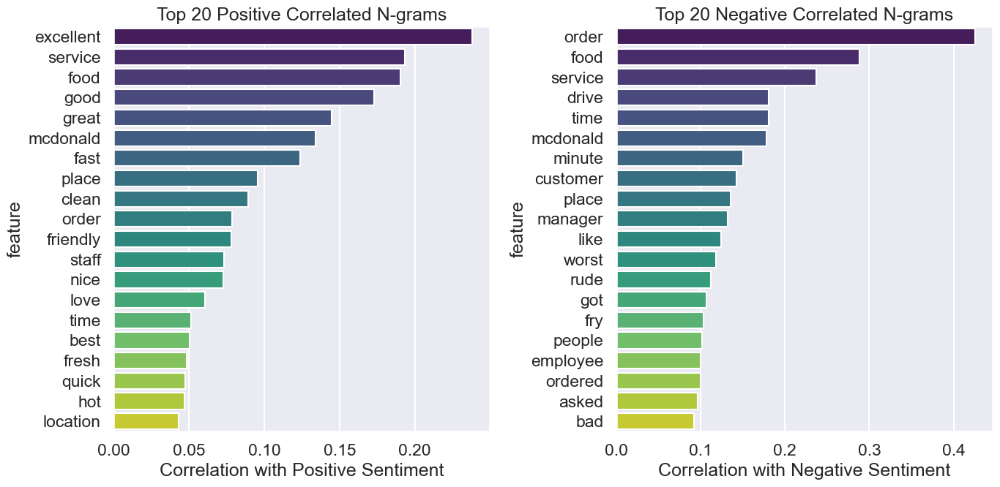

In [147]:
# Plot the top positive and negative correlated n-grams
plt.figure(figsize=(14, 7))

# Top Positive N-grams
plt.subplot(1, 2, 1)
sns.barplot(y=top_positive_ngrams['feature'], x=top_positive_ngrams['correlation'], palette='viridis')
plt.title('Top 20 Positive Correlated N-grams')
plt.xlabel('Correlation with Positive Sentiment')

# Top Negative N-grams
plt.subplot(1, 2, 2)
sns.barplot(y=top_negative_ngrams['feature'], x=top_negative_ngrams['correlation'], palette='viridis')
plt.title('Top 20 Negative Correlated N-grams')
plt.xlabel('Correlation with Negative Sentiment')

plt.tight_layout()
plt.show()

## aspect based - predefined keyword

In [91]:
# Load the GloVe model
glove_model = api.load("glove-wiki-gigaword-100")  # Using a 100-dimensional GloVe model


# Define aspect keywords
seed_words = {
    'product_quality': ['taste', 'delicious', 'fresh', 'quality', 'food', 'flavor', 'tasty', 'yummy', 'stale', 'cold', 'hot', 'portion', 'meal', 'dish', 'ingredient', 'cooked', 'undercooked', 'overcooked'],
    'customer_service': ['service', 'staff', 'treat', 'friendly', 'helpful', 'attentive', 'rude', 'polite', 'slow', 'quick', 'wait', 'manager', 'employee', 'cashier', 'order', 'mistake', 'fix', 'resolve', 'assistance'],
    'cleanliness': ['clean', 'hygiene', 'neat', 'dirty', 'messy', 'sanitize', 'filthy', 'spotless', 'restroom', 'bathroom', 'table', 'floor', 'garbage', 'trash', 'smell', 'odor'],
    'price': ['price', 'expensive', 'cheap', 'value', 'cost', 'affordable', 'reasonable', 'overpriced', 'worth', 'deal', 'discount', 'offer', 'promotion'],
    'ambiance': ['ambiance', 'atmosphere', 'environment', 'decor', 'music', 'noise', 'loud', 'quiet', 'comfortable', 'seating', 'space', 'crowded', 'busy', 'calm', 'lighting', 'design'],
    'convenience': ['location', 'parking', 'drive-thru', 'accessible', 'convenient', 'close', 'near', 'far', 'distance', 'hours', 'open', 'close', 'availability', 'wait', 'line'],
    'speed_of_service': ['quick', 'fast', 'slow', 'wait', 'delay', 'prompt', 'timely', 'speed', 'efficient', 'time', 'minute', 'hour'],
    'order_accuracy': ['order', 'mistake', 'wrong', 'correct', 'accuracy', 'error', 'missing', 'add', 'remove', 'special', 'instruction', 'note']
    }

def expand_categories(seed_words, model, top_n=10):
    expanded_categories = {}
    for category, seeds in seed_words.items():
        expanded_keywords = set(seeds)
        for seed in seeds:
            # Most similar words based on the GloVe vectors
            if seed in model:
                similar_words = model.most_similar(seed, topn=top_n)
                expanded_keywords.update([word for word, _ in similar_words])
        expanded_categories[category] = list(expanded_keywords)
    return expanded_categories

aspects = expand_categories(seed_words, glove_model)

In [92]:
# Download necessary NLTK data
nltk.download('vader_lexicon')
nltk.download('punkt')


# Initialize VADER
sia = SentimentIntensityAnalyzer()

# Function to analyze aspect-based sentiments for individual reviews
def analyze_reviews(reviews):
    aspect_data = []

    for review in reviews:
        sentences = sent_tokenize(review)
        review_aspects = {}
        
        for aspect, keywords in aspects.items():
            aspect_scores = []
            
            for sentence in sentences:
                if any(keyword in sentence for keyword in keywords):
                    sentiment_score = sia.polarity_scores(sentence)['compound']
                    aspect_scores.append(sentiment_score)
            
            # Average sentiment for the aspect in this review, if any scores were found
            if aspect_scores:
                review_aspects[aspect] = sum(aspect_scores) / len(aspect_scores)
            else:
                review_aspects[aspect] = None  # No sentiment data for this aspect in this review
        
        aspect_data.append(review_aspects)

    return pd.DataFrame(aspect_data)

# Analyze the reviews from the existing DataFrame
aspect_sentiment_df = analyze_reviews(df['review'])

# Merge the aspect sentiments back into the existing DataFrame
aspect_based_df = pd.concat([df, aspect_sentiment_df], axis=1)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\798677\AppData\Roaming\nltk_data...
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\798677\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [93]:
aspect_sentiment_df.head(5)

,product_quality,customer_service,cleanliness,price,ambiance,convenience,speed_of_service,order_accuracy
0,0.37325,0.3853,NaN,NaN,0.3853,0.37325,0.37325,0.37325
1,NaN,-0.3535,-0.3535,-0.3535,NaN,-0.35350,-0.35350,-0.35350
2,0.00000,0.0000,NaN,NaN,0.0000,NaN,0.00000,0.00000
3,-0.80200,-0.8020,NaN,-0.8020,NaN,-0.80200,-0.80200,-0.80200
4,NaN,-0.5267,-0.5267,NaN,NaN,-0.52670,-0.52670,-0.52670


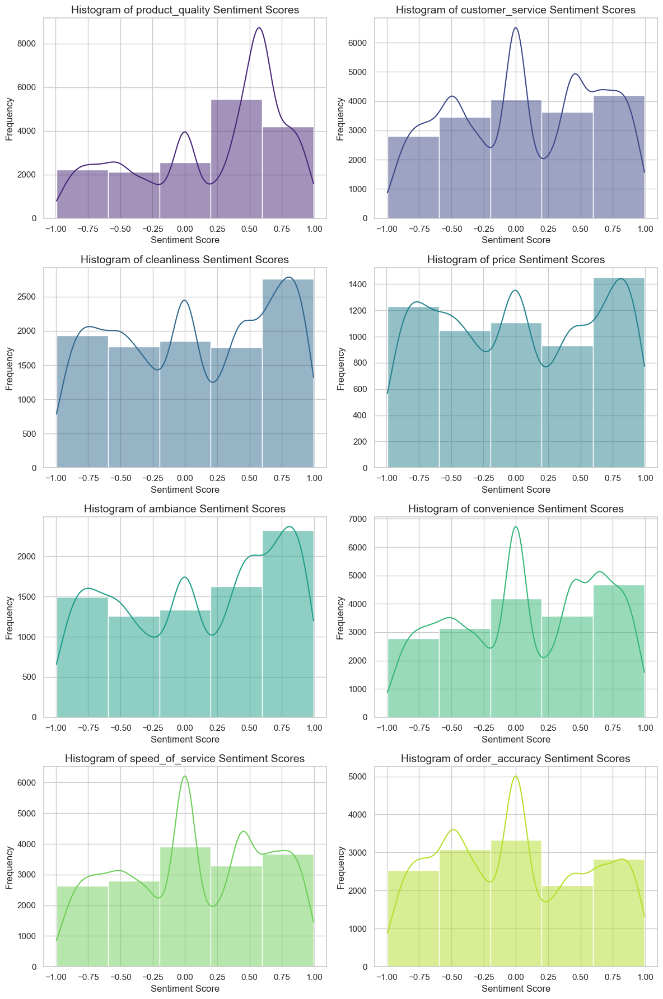

In [94]:
# Define a color palette
palette = sns.color_palette("viridis", n_colors=len(aspect_sentiment_df.columns))

# Plot histograms
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 18))
axes = axes.flatten()  # Flatten the axes array for easy iteration

for ax, (aspect, color) in zip(axes, zip(aspect_sentiment_df.columns, palette)):
    sns.histplot(aspect_sentiment_df[aspect], ax=ax, bins=5, color=color, kde=True)  # Add a KDE curve for smooth distribution
    ax.set_title(f'Histogram of {aspect} Sentiment Scores', fontsize=14)
    ax.set_xlabel('Sentiment Score', fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)
    ax.grid(True)  # Adding grid lines for better readability

plt.tight_layout()
plt.show()

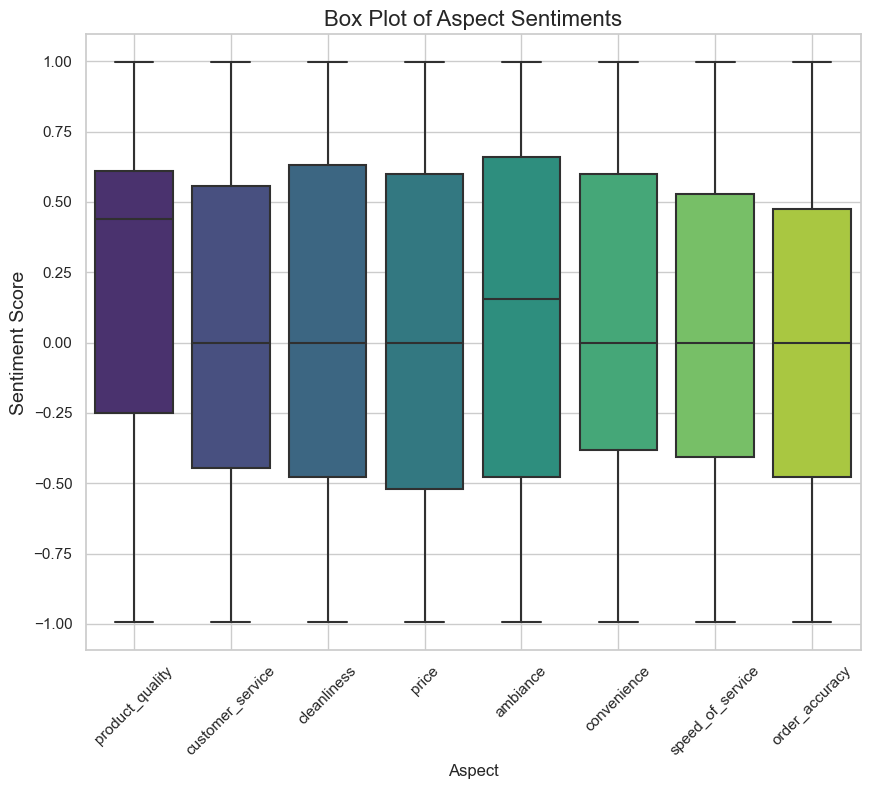

In [95]:
# Plot box plots using a color palette
plt.figure(figsize=(10, 8))
box_plot = sns.boxplot(data=aspect_sentiment_df, palette=palette)
plt.title('Box Plot of Aspect Sentiments', fontsize=16)
plt.xlabel('Aspect', fontsize=12)
plt.ylabel('Sentiment Score', fontsize=14)
plt.grid(True)  # Adding grid lines for better readability

# Rotate x-axis labels for better readability
box_plot.set_xticklabels(box_plot.get_xticklabels(), rotation=45)

plt.show()

# Extra Models!
___________________________

## Traditional models

### Logistic Regression - (Accuracy 80%)

In [62]:
%%time

# Logistic Regression
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train_resampled, y_train_resampled)
y_pred_lr = lr_model.predict(X_test_vec)
print("Logistic Regression Accuracy:\n", classification_report(y_test_vec, y_pred_lr))

Logistic Regression Accuracy:
               precision    recall  f1-score   support

           0       0.87      0.85      0.86      1877
           1       0.55      0.66      0.60       959
           2       0.89      0.82      0.85      2045

    accuracy                           0.80      4881
   macro avg       0.77      0.78      0.77      4881
weighted avg       0.81      0.80      0.80      4881

CPU times: total: 266 ms
Wall time: 472 ms


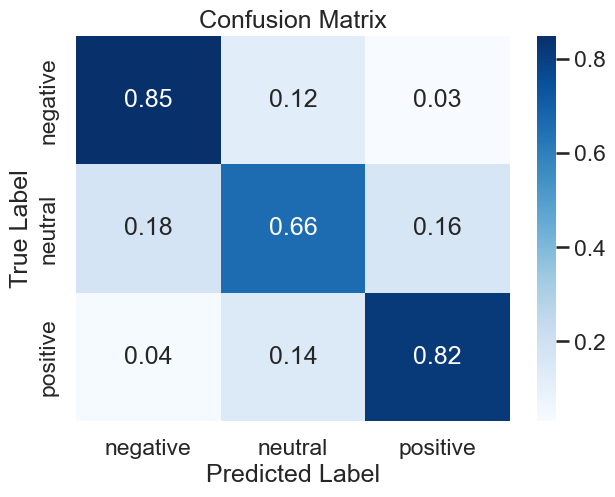

In [63]:
plot_confusion_matrix(lr_model, X_test_vec, y_test_vec, sentiment_titles, normalize=True, model_type='traditional')

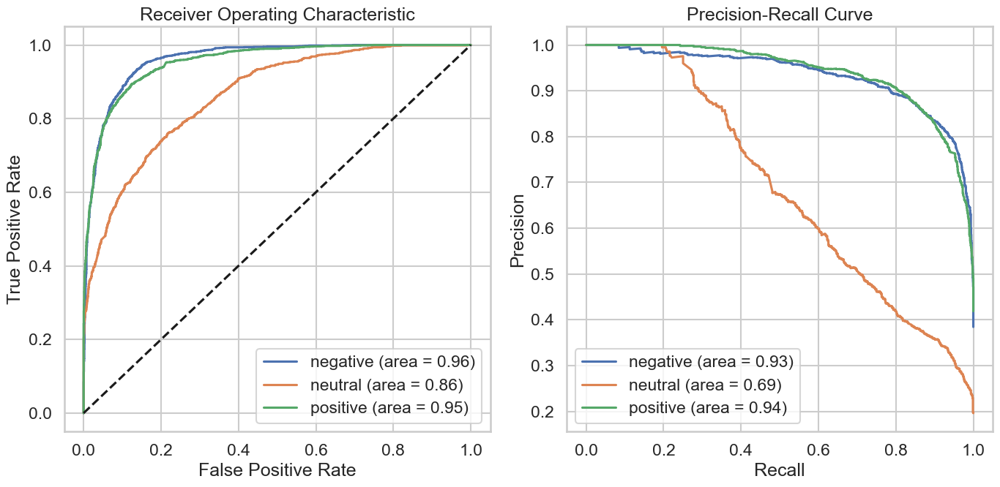

In [64]:
evaluate_model(lr_model, X_test_vec, y_test_vec, sentiment_titles, 'traditional')

### SVM  - (Accuracy 79%)

In [66]:
%%time

# Train the model
svm_model = SVC(kernel='linear')
svm_model.fit(X_train_resampled, y_train_resampled)

# Make predictions
y_pred_svm = svm_model.predict(X_test_vec)

# Print accuracy
print("SVM Accuracy:\n", classification_report(y_test_vec, y_pred_svm))

SVM Accuracy:
               precision    recall  f1-score   support

           0       0.87      0.83      0.85      1877
           1       0.53      0.67      0.60       959
           2       0.89      0.82      0.85      2045

    accuracy                           0.79      4881
   macro avg       0.76      0.77      0.77      4881
weighted avg       0.81      0.79      0.80      4881

CPU times: total: 11.1 s
Wall time: 21.7 s


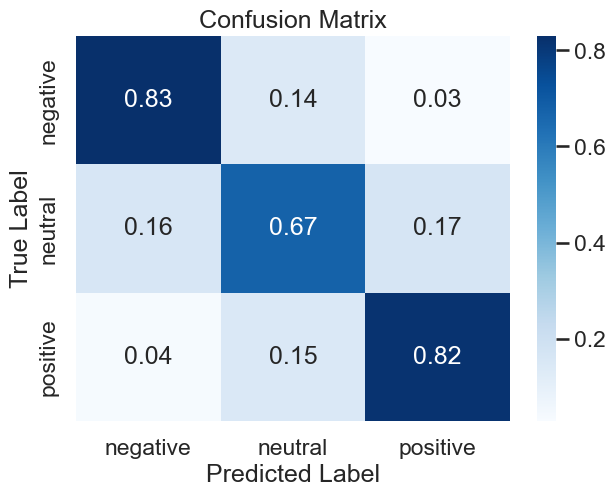

In [67]:
plot_confusion_matrix(svm_model, X_test_vec, y_test_vec, sentiment_titles, normalize=True, model_type='traditional')

In [68]:
#evaluate_model(svm_model, X_test_vec, y_test_vec, sentiment_titles, 'traditional')

### Random Forest - (Accuracy 84%)

In [69]:
%%time
# Train the model
rf_model = RandomForestClassifier(n_estimators=100)
rf_model.fit(X_train_vec, y_train_vec)

# Make predictions
y_pred_rf = rf_model.predict(X_test_vec)

# Print accuracy
print("Random Forest Accuracy:", accuracy_score(y_test_vec, y_pred_rf))

Random Forest Accuracy: 0.8387625486580619
CPU times: total: 14.3 s
Wall time: 31.5 s


In [70]:
print(classification_report(y_test_vec, y_pred_rf))

              precision    recall  f1-score   support

           0       0.83      0.93      0.88      1877
           1       0.83      0.50      0.62       959
           2       0.85      0.92      0.88      2045

    accuracy                           0.84      4881
   macro avg       0.84      0.78      0.79      4881
weighted avg       0.84      0.84      0.83      4881



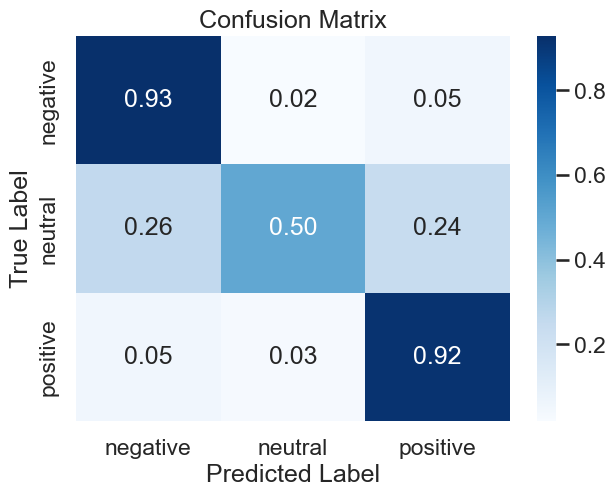

In [71]:
plot_confusion_matrix(rf_model, X_test_vec, y_test_vec, sentiment_titles, normalize=True, model_type='traditional')

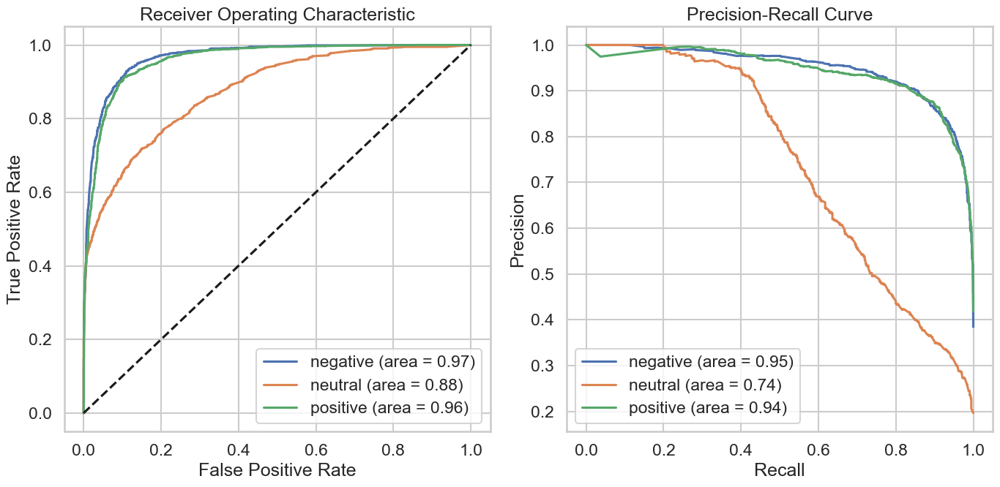

In [72]:
evaluate_model(rf_model, X_test_vec, y_test_vec, sentiment_titles, 'traditional')

## Deep learning models

### RNN - (Accuracy 76%)

In [131]:
%%time
model = Sequential()

# --> Embedding
# -> Manual Embedding
model.add(Embedding(input_dim=5000, output_dim=100, input_length=maxlen))
# -> using Glove 
#model.add(Embedding(vocab_size, embedding_dim, input_length=maxlen, weights=[embedding_matrix], trainable=False))

# --> First Layer
model.add(SimpleRNN(32, return_sequences=True, dropout=0.3)) 
model.add(BatchNormalization())

# --> Second Layer
model.add(SimpleRNN(64, return_sequences=False, dropout=0.2))
model.add(BatchNormalization())

# --> Dense Layers
#model.add(Dense(32, activation='relu'))
model.add(Dense(3, activation='softmax'))


# --> Compile model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(X_train_pad_smote_splited, y_train_pad_smote_splited, batch_size=32, epochs=12, validation_data=(X_val_pad_smote_splited, y_val_pad_smote_splited), callbacks=[early_stopping])

loss, accuracy = model.evaluate(X_test_pad, y_test_pad)
print(f'Test Accuracy: {accuracy}')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 100)          500000    
                                                                 
 simple_rnn (SimpleRNN)      (None, 100, 32)           4256      
                                                                 
 batch_normalization_1 (Bat  (None, 100, 32)           128       
 chNormalization)                                                
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 64)                6208      
                                                                 
 batch_normalization_2 (Bat  (None, 64)                256       
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 3)                

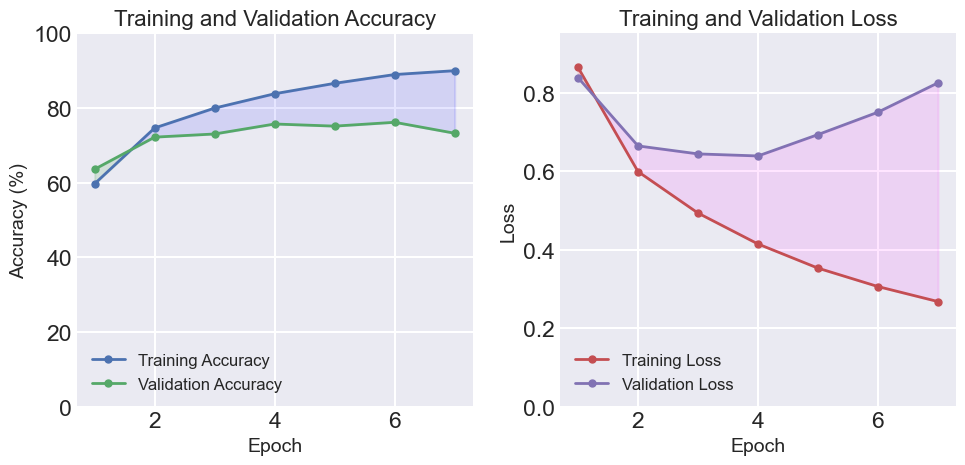

In [132]:
plot_metrics(history)

153/153 [==============================] - 2s 8ms/step


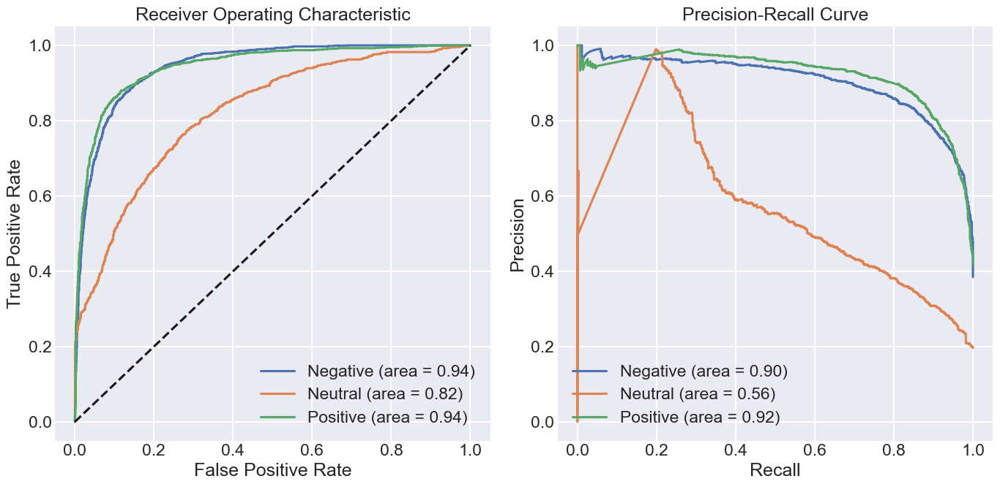

In [133]:
evaluate_model(model, X_test_pad, y_test_pad, class_labels, 'deep_learning')

153/153 [==============================] - 1s 8ms/step


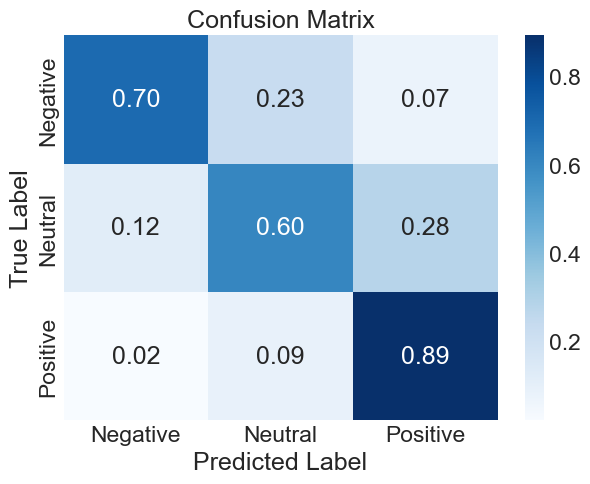

In [134]:
plot_confusion_matrix(model, X_test_pad, y_test_pad, class_labels, normalize=True, model_type='deep_learning')

In [135]:
# Step 1: Get predictions (probabilities) from the RNN model
pred_probabilities = model.predict(X_test_pad)

# Step 2: Convert predicted probabilities to class labels
pred_labels_class = np.argmax(pred_probabilities, axis=1)

# Step 3: Ensure true labels (y_test_pad) are in label format (not one-hot encoded)
if y_test_pad.ndim > 1 and y_test_pad.shape[1] > 1:
    y_test_labels = np.argmax(y_test_pad, axis=1)
else:
    y_test_labels = y_test_pad

# Step 4: Generate the classification report
report = classification_report(y_test_labels, pred_labels_class, target_names=['negative', 'neutral', 'positive'])
print(report)

153/153 [==============================] - 1s 7ms/step
              precision    recall  f1-score   support

    negative       0.90      0.70      0.78      1877
     neutral       0.49      0.60      0.54       959
    positive       0.82      0.89      0.85      2045

    accuracy                           0.76      4881
   macro avg       0.73      0.73      0.73      4881
weighted avg       0.78      0.76      0.77      4881



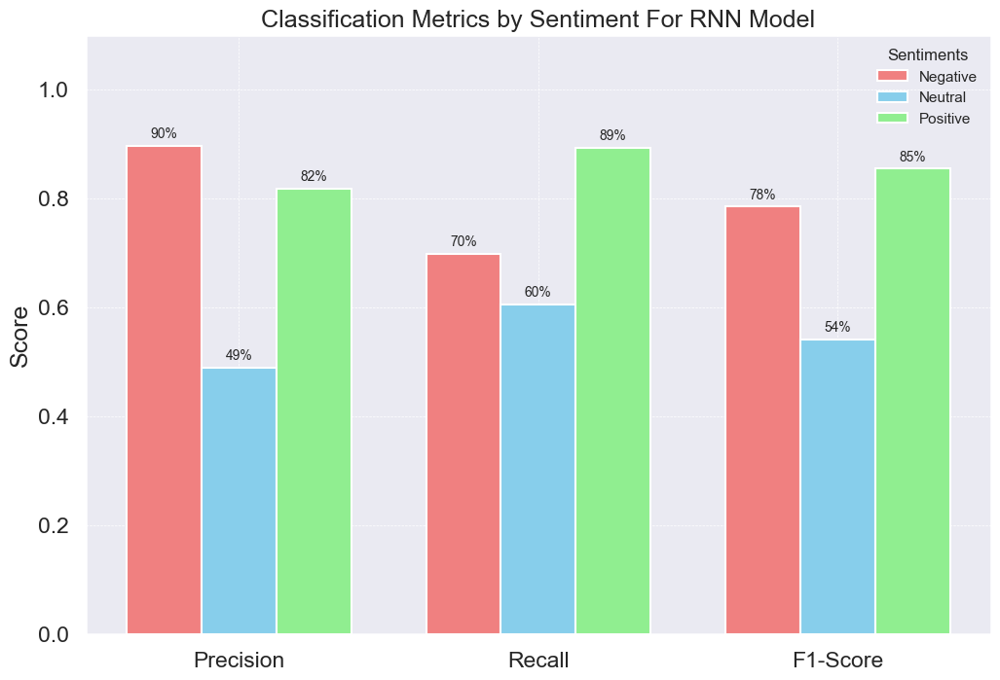

In [136]:
plot_classification_metrics(y_test_labels, pred_labels_class, title="Classification Metrics by Sentiment For RNN Model")

### LSTM

#### simple LSTM - (Accuracy 80%)

In [137]:
%%time
model = Sequential()

# --> Embedding

# -> Manual Embedding
model.add(Embedding(input_dim=5000, output_dim=100, input_length=maxlen))
# -> using Glove 
#model.add(Embedding(vocab_size, embedding_dim, input_length=maxlen, weights=[embedding_matrix], trainable=False))


# --> First Layer
model.add(LSTM(32, return_sequences=False)) 
#model.add(BatchNormalization())

# --> Second Layer
#model.add(LSTM(64, return_sequences=False, dropout=0.2))
#model.add(BatchNormalization())

# --> Dense Layers
model.add(Dense(3, activation='softmax'))


# --> Compile model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(X_train_pad_smote_splited, y_train_pad_smote_splited, batch_size=64, epochs=12, validation_data=(X_val_pad_smote_splited, y_val_pad_smote_splited), callbacks=[early_stopping])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 100, 100)          500000    
                                                                 
 lstm_1 (LSTM)               (None, 32)                17024     
                                                                 
 dense_3 (Dense)             (None, 3)                 99        
                                                                 
Total params: 517123 (1.97 MB)
Trainable params: 517123 (1.97 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/12
288/288 [==============================] - 15s 42ms/step - loss: 0.7185 - accuracy: 0.6782 - val_loss: 0.5548 - val_accuracy: 0.7643
Epoch 2/12
288/288 [==============================] - 11s 39ms/step - loss: 0.4748 - accuracy: 0.8065 - val_loss: 0.5323 - val_accuracy: 0

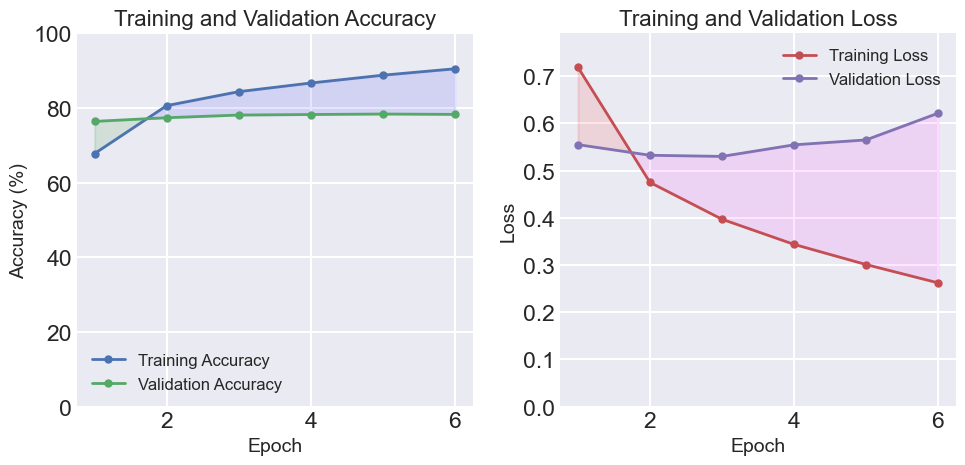

In [140]:
plot_metrics(history)

153/153 [==============================] - 1s 9ms/step


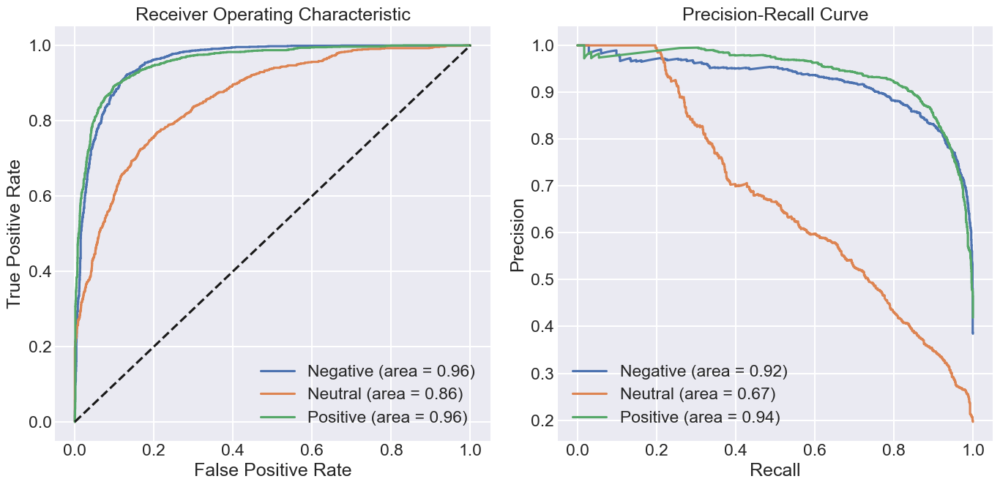

In [141]:
class_labels=['Negative', 'Neutral', 'Positive']
evaluate_model(model, X_test_pad, y_test_pad, class_labels, 'deep_learning')

153/153 [==============================] - 1s 9ms/step


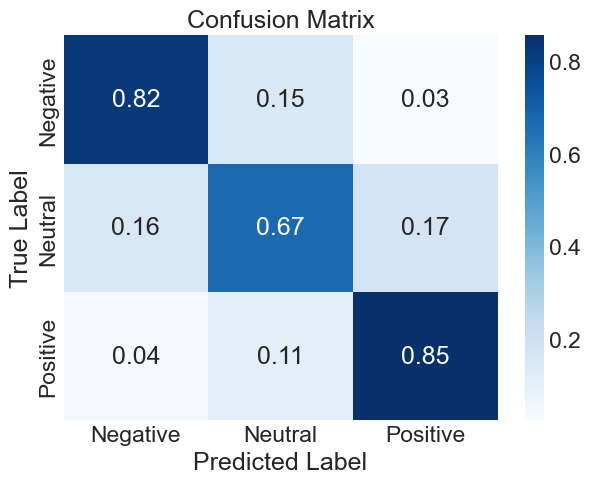

In [142]:
plot_confusion_matrix(model, X_test_pad, y_test_pad, class_labels, normalize=True, model_type='deep_learning')

In [143]:
# Step 1: Get predictions (probabilities) from the RNN model
pred_probabilities = model.predict(X_test_pad)

# Step 2: Convert predicted probabilities to class labels
pred_labels_class = np.argmax(pred_probabilities, axis=1)

# Step 3: Ensure true labels (y_test_pad) are in label format (not one-hot encoded)
if y_test_pad.ndim > 1 and y_test_pad.shape[1] > 1:
    y_test_labels = np.argmax(y_test_pad, axis=1)
else:
    y_test_labels = y_test_pad

# Step 4: Generate the classification report
report = classification_report(y_test_labels, pred_labels_class, target_names=['negative', 'neutral', 'positive'])
print(report)

153/153 [==============================] - 1s 8ms/step
              precision    recall  f1-score   support

    negative       0.87      0.82      0.85      1877
     neutral       0.56      0.67      0.61       959
    positive       0.89      0.85      0.87      2045

    accuracy                           0.81      4881
   macro avg       0.77      0.78      0.78      4881
weighted avg       0.82      0.81      0.81      4881



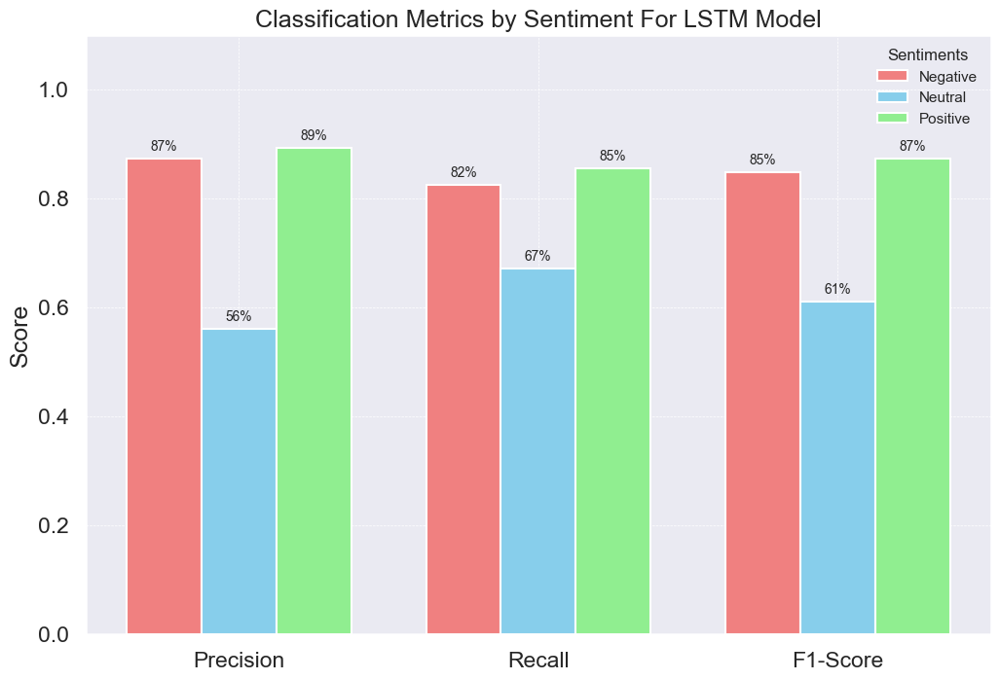

In [139]:
plot_classification_metrics(y_test_labels, pred_labels_class, title="Classification Metrics by Sentiment For LSTM Model")

#### Hyperparameter tuning LSTM

In [76]:
class RNNHyperModel(HyperModel):
    def __init__(self, word_index, embedding_matrix, input_length, model_type='LSTM'):
        self.word_index = word_index
        self.embedding_matrix = embedding_matrix
        self.input_length = input_length
        self.model_type = model_type

    def build(self, hp):
        model = Sequential()
        
        # Embedding layer with GloVe weights
        model.add(Embedding(input_dim=self.embedding_matrix.shape[0],
                            output_dim=self.embedding_matrix.shape[1],
                            weights=[self.embedding_matrix],
                            input_length=self.input_length,
                            trainable=False))  # Set trainable to False to keep the embeddings fixed

        # Configuring the RNN layer type based on user selection
        if self.model_type == 'SimpleRNN':
            RNNLayer = SimpleRNN
        elif self.model_type == 'LSTM':
            RNNLayer = LSTM
        elif self.model_type == 'GRU':
            RNNLayer = GRU
        elif self.model_type == 'BiLSTM':
            RNNLayer = lambda *args, **kwargs: Bidirectional(LSTM(*args, **kwargs))
        else:
            raise ValueError("Unsupported model type. Choose 'SimpleRNN', 'LSTM', 'GRU', or 'BiLSTM'.")

        # RNN layer with hyperparameters
        model.add(RNNLayer(
            units=hp.Int('units', min_value=32, max_value=128, step=32),
            return_sequences=False,
            dropout=hp.Float('dropout', min_value=0.1, max_value=0.5, step=0.1)
        ))
        model.add(BatchNormalization())

        # Dense layers
        model.add(Dense(
            units=hp.Int('dense_units', min_value=32, max_value=64, step=16),
            activation='relu'
        ))
        model.add(Dense(3, activation='softmax'))

        # Compile the model
        model.compile(
            optimizer=Adam(hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='LOG')),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
        return model

In [78]:
# model type: 'SimpleRNN', 'LSTM', 'GRU', 'BiLSTM'
model_type='LSTM'
hypermodel = RNNHyperModel(word_index, embedding_matrix, input_length=100, model_type=model_type)

tuner = RandomSearch(
    hypermodel,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=1,
    directory='hyperparam_tuning',
    project_name=f'{model_type}_tuning'
)

early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Start search
tuner.search(X_train_pad_smote_splited, y_train_pad_smote_splited,
             epochs=12,
             batch_size=64,
             validation_data=(X_val_pad_smote_splited, y_val_pad_smote_splited),
             callbacks=[early_stopping])

Trial 10 Complete [00h 07m 20s]
val_accuracy: 0.7869600653648376

Best val_accuracy So Far: 0.797228991985321
Total elapsed time: 18d 01h 23m 33s


In [81]:
# Get the best hyperparameters
best_hyperparameters = tuner.get_best_hyperparameters()[0]
print('Best hyperparameters:', best_hyperparameters.values)

Best hyperparameters: {'units': 128, 'dropout': 0.5, 'dense_units': 64, 'learning_rate': 0.0013653501948374237}


#### LSTM - Best model - (Accuracy 82%)

In [125]:
# Extract the best model
best_LSTM_model = tuner.get_best_models(num_models=1)[0]
best_LSTM_history = best_LSTM_model.fit(X_train_pad_smote_splited, y_train_pad_smote_splited, epochs=12, batch_size=64, validation_data=(X_val_pad_smote_splited, y_val_pad_smote_splited), callbacks=[early_stopping])

Epoch 1/12
288/288 [==============================] - 42s 136ms/step - loss: 0.4738 - accuracy: 0.8031 - val_loss: 0.5250 - val_accuracy: 0.7894
Epoch 2/12
288/288 [==============================] - 38s 133ms/step - loss: 0.4612 - accuracy: 0.8086 - val_loss: 0.5578 - val_accuracy: 0.7681
Epoch 3/12
288/288 [==============================] - 38s 132ms/step - loss: 0.4574 - accuracy: 0.8100 - val_loss: 0.5263 - val_accuracy: 0.7829
Epoch 4/12
288/288 [==============================] - 38s 132ms/step - loss: 0.4427 - accuracy: 0.8167 - val_loss: 0.5524 - val_accuracy: 0.7826


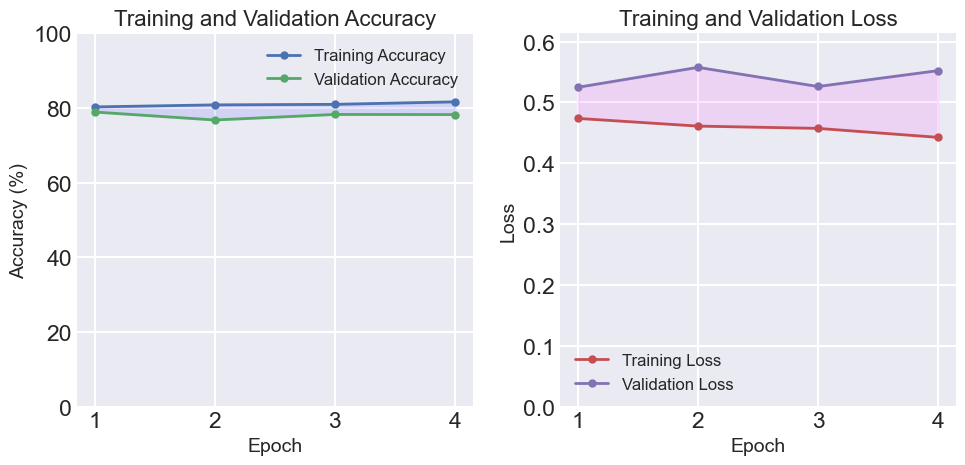

In [126]:
plot_metrics(best_LSTM_history)

153/153 [==============================] - 5s 27ms/step


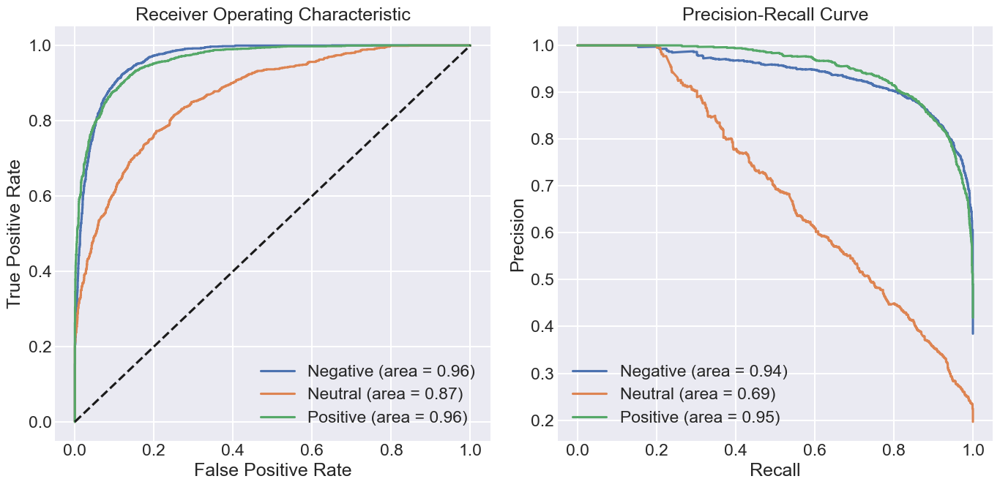

In [127]:
class_labels=['Negative', 'Neutral', 'Positive']
evaluate_model(best_LSTM_model, X_test_pad, y_test_pad, class_labels, 'deep_learning')

153/153 [==============================] - 4s 27ms/step


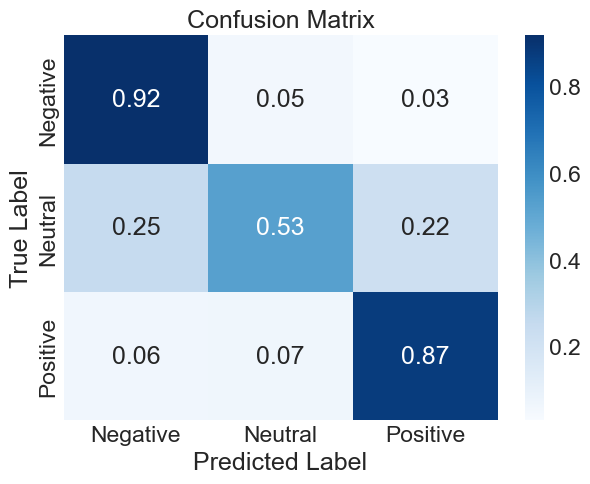

In [128]:
plot_confusion_matrix(best_LSTM_model, X_test_pad, y_test_pad, class_labels, normalize=True, model_type='deep_learning')

In [144]:
# Step 1: Get predictions (probabilities) from the RNN model
pred_probabilities = best_LSTM_model.predict(X_test_pad)

# Step 2: Convert predicted probabilities to class labels
pred_labels_class = np.argmax(pred_probabilities, axis=1)

# Step 3: Ensure true labels (y_test_pad) are in label format (not one-hot encoded)
if y_test_pad.ndim > 1 and y_test_pad.shape[1] > 1:
    y_test_labels = np.argmax(y_test_pad, axis=1)
else:
    y_test_labels = y_test_pad

# Step 4: Generate the classification report
report = classification_report(y_test_labels, pred_labels_class, target_names=['negative', 'neutral', 'positive'])
print(report)

153/153 [==============================] - 4s 25ms/step
              precision    recall  f1-score   support

    negative       0.82      0.92      0.87      1877
     neutral       0.68      0.53      0.59       959
    positive       0.87      0.87      0.87      2045

    accuracy                           0.82      4881
   macro avg       0.79      0.77      0.78      4881
weighted avg       0.82      0.82      0.82      4881



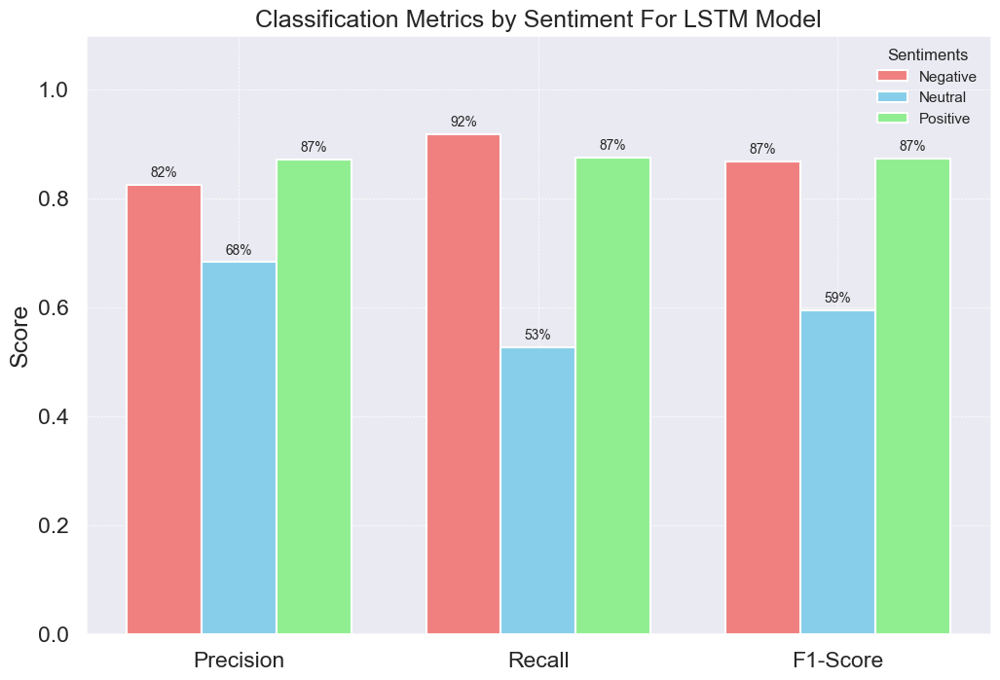

In [145]:
plot_classification_metrics(y_test_labels, pred_labels_class, title="Classification Metrics by Sentiment For LSTM Model")

### BiLSTM - (Accuracy 80%)

In [99]:
%%time
model = Sequential()

# --> Embedding
# -> Manual Embedding
model.add(Embedding(input_dim=5000, output_dim=100, input_length=maxlen))
# -> using Glove 
#model.add(Embedding(vocab_size, embedding_dim, input_length=maxlen, weights=[embedding_matrix], trainable=False))

# --> First Layer
model.add(Bidirectional(LSTM(64, return_sequences=False, dropout=0.2)))
#model.add(BatchNormalization())

# --> Second Layer
#model.add(Bidirectional(LSTM(32, return_sequences=False, dropout=0.2)))
#model.add(BatchNormalization())

# --> Dense Layers
#model.add(Dense(64, activation='relu'))
model.add(Dense(3, activation='softmax'))


# --> Compile model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(X_train_pad_smote_splited, y_train_pad_smote_splited, batch_size=64, epochs=12, validation_data=(X_val_pad_smote_splited, y_val_pad_smote_splited), callbacks=[early_stopping])

loss, accuracy = model.evaluate(X_test_pad, y_test_pad)
print(f'Test Accuracy: {accuracy}')

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 100, 100)          500000    
                                                                 
 bidirectional (Bidirection  (None, 128)               84480     
 al)                                                             
                                                                 
 dense_5 (Dense)             (None, 3)                 387       
                                                                 
Total params: 584867 (2.23 MB)
Trainable params: 584867 (2.23 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/12
288/288 [==============================] - 42s 129ms/step - loss: 0.7287 - accuracy: 0.6676 - val_loss: 0.5586 - val_accuracy: 0.7589
Epoch 2/12
288/288 [==============================] - 36s 126ms/step - 

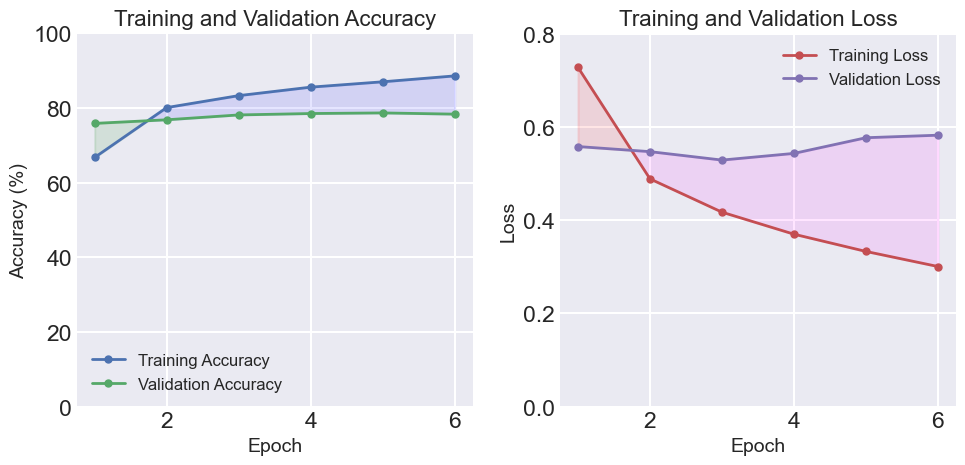

In [100]:
plot_metrics(history)

153/153 [==============================] - 4s 18ms/step


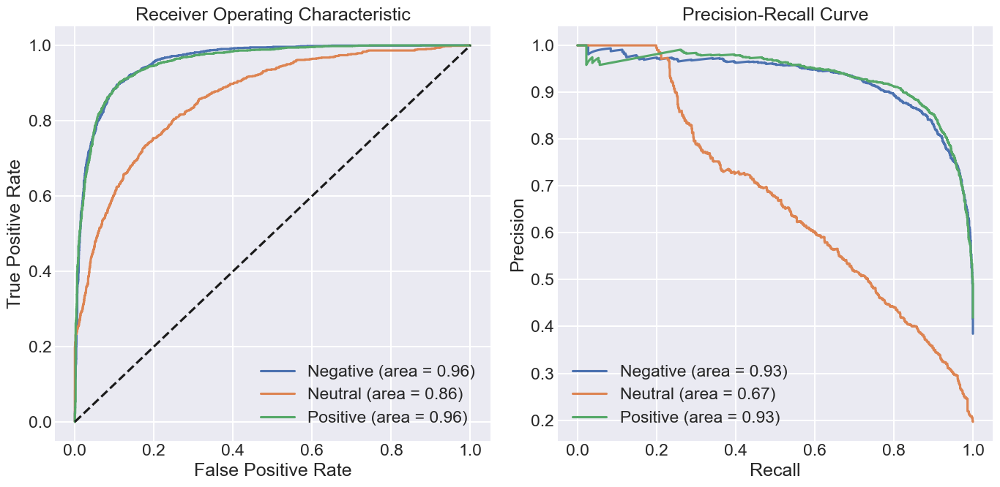

In [101]:
evaluate_model(model, X_test_pad, y_test_pad, class_labels, 'deep_learning')

153/153 [==============================] - 3s 17ms/step


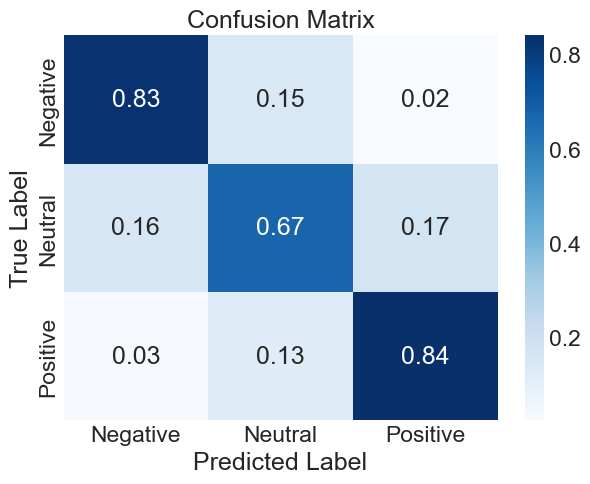

In [102]:
plot_confusion_matrix(model, X_test_pad, y_test_pad, class_labels, normalize=True, model_type='deep_learning')

In [120]:
# Step 1: Get predictions (probabilities) from the RNN model
pred_probabilities = model.predict(X_test_pad)

# Step 2: Convert predicted probabilities to class labels
pred_labels_class = np.argmax(pred_probabilities, axis=1)

# Step 3: Ensure true labels (y_test_pad) are in label format (not one-hot encoded)
if y_test_pad.ndim > 1 and y_test_pad.shape[1] > 1:
    y_test_labels = np.argmax(y_test_pad, axis=1)
else:
    y_test_labels = y_test_pad

# Step 4: Generate the classification report
report = classification_report(y_test_labels, pred_labels_class, target_names=['negative', 'neutral', 'positive'])
print(report)

              precision    recall  f1-score   support

    negative       0.88      0.83      0.85      1877
     neutral       0.55      0.67      0.60       959
    positive       0.89      0.84      0.87      2045

    accuracy                           0.80      4881
   macro avg       0.77      0.78      0.77      4881
weighted avg       0.82      0.80      0.81      4881



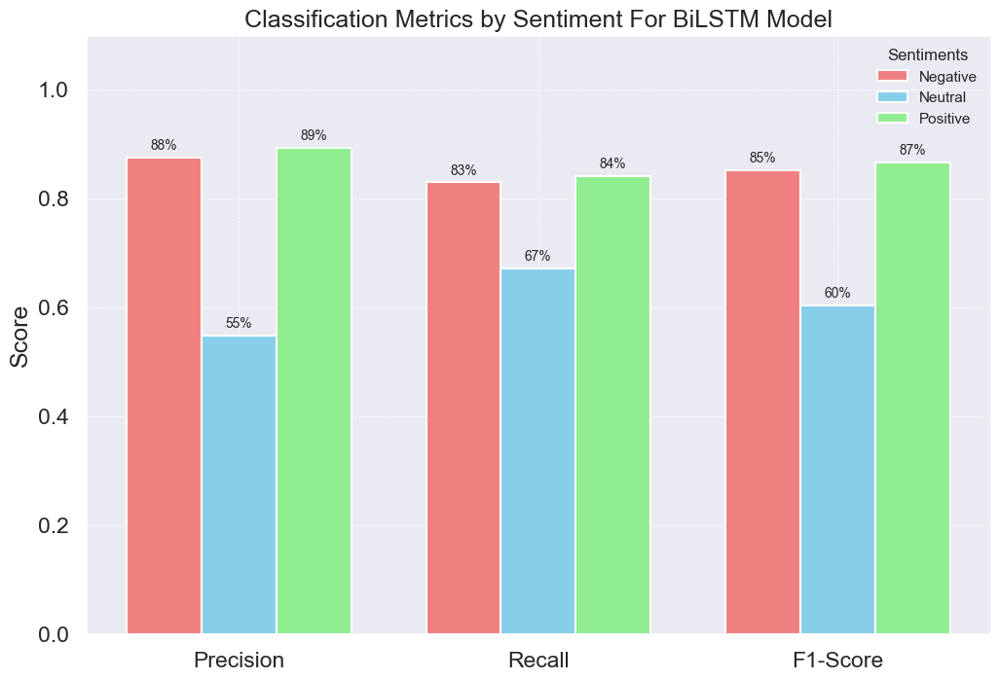

In [124]:
plot_classification_metrics(y_test_labels, pred_labels_class, title="Classification Metrics by Sentiment For BiLSTM Model")

## Fine-tuning other Pretrained models

### Roberta - (Accuracy 84%)

#### Configuration

In [9]:
# setting output dir for Roberta model
Roberta_output_dir = './Roberta-results'
os.makedirs(Bert_Bestmodel_output_dir, exist_ok=True)

Roberta_logging_dir = './Roberta-logs'
os.makedirs(Bert_Bestmodel_logging_dir, exist_ok=True)

In [10]:
labels = ["negative", "neutral", "positive"]

label2id = {label: idx for idx, label in enumerate(labels)}
id2label = {idx: label for label, idx in label2id.items()}

In [11]:
# Load a pre-defined configuration for BERT
config = BertConfig.from_pretrained(
    'roberta-base',
    num_labels=3,                     # Number of output labels (for 3 classes)
    id2label=id2label,                # Mapping from IDs to labels
    label2id=label2id,                # Mapping from labels to IDs
    output_hidden_states=False,       # Whether to output hidden states
    output_attentions=False,          # Whether to output attention weights
    hidden_dropout_prob=0.2,          # Dropout rate for fully connected layers
    attention_probs_dropout_prob=0.2 # Dropout rate for attention probabilities
    #max_position_embeddings=128       # Max position embeddings (adjust based on sentence length)
)

# Load the tokenizer for Roberta
tokenizer = BertTokenizer.from_pretrained('roberta-base')

# Load the model with the custom config for Roberta
model = BertForSequenceClassification.from_pretrained('roberta-base', config=config)

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


#### train, val, test dataset preparing

In [9]:
train_val_data, test_data, train_val_labels, test_labels = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)
train_texts, val_texts, train_labels, val_labels = train_test_split(train_val_data, train_val_labels, test_size=0.25, random_state=42, stratify=train_val_labels)

In [10]:
train_texts = train_texts.reset_index(drop=True)
val_texts = val_texts.reset_index(drop=True)
test_texts = test_data.reset_index(drop=True)

train_labels = train_labels.reset_index(drop=True)
val_labels = val_labels.reset_index(drop=True)
test_labels = test_labels.reset_index(drop=True)

In [85]:
train_encodings = tokenizer(train_texts.tolist(), truncation=True, padding=True, max_length=128)
val_encodings = tokenizer(val_texts.tolist(), truncation=True, padding=True, max_length=128)
test_encodings = tokenizer(test_texts.tolist(), truncation=True, padding=True, max_length=128)

In [86]:
class SentimentDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = SentimentDataset(train_encodings, train_labels.tolist())
val_dataset = SentimentDataset(val_encodings, val_labels.tolist())
test_dataset = SentimentDataset(test_encodings, test_labels.tolist())

#### Compute class weight

In [87]:
# Compute class weights
labels = np.unique(train_labels)
class_weights = compute_class_weight('balanced', classes=labels, y=train_labels)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

'''
model.classifier = nn.Linear(model.config.hidden_size, model.config.num_labels)
model.num_labels = config.num_labels
model.loss_fct = nn.CrossEntropyLoss(weight=class_weights_tensor)'''

'\nmodel.classifier = nn.Linear(model.config.hidden_size, model.config.num_labels)\nmodel.num_labels = config.num_labels\nmodel.loss_fct = nn.CrossEntropyLoss(weight=class_weights_tensor)'

#### Training model

In [58]:
training_args = TrainingArguments(
    output_dir=output_dir,
    num_train_epochs=3,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./roberta-logs',
    logging_steps=100,
    save_steps=1000,
    save_total_limit=1,
    evaluation_strategy="steps",
    eval_steps=500,
    load_best_model_at_end=True,
    metric_for_best_model='accuracy'
)


# Initialize the Trainer
trainer = WeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics
)

In [59]:
# Train the model
try:
    trainer.train()
except Exception as e:
    print("An error occurred during training:", str(e))

Step,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
500,0.382300,1.148590,0.822379,0.823452,0.824735,0.822379
1000,0.552500,0.816376,0.808091,0.796700,0.799381,0.808091
1500,0.599300,0.704366,0.822981,0.811065,0.809503,0.822981
2000,0.655200,0.954042,0.825538,0.801654,0.829634,0.825538
2500,0.596400,0.659299,0.832306,0.831044,0.830893,0.832306
3000,0.529500,0.684070,0.826590,0.831726,0.839359,0.826590
3500,0.542700,0.760593,0.837118,0.837468,0.837847,0.837118
4000,0.594300,0.679216,0.837419,0.834491,0.832332,0.837419
4500,0.606000,0.671876,0.840427,0.832022,0.830512,0.840427
5000,0.456200,0.743730,0.842834,0.841577,0.840698,0.842834


logits: [[-3.3674793  -0.7919305   4.607229  ]
 [-3.3732567  -0.8133517   4.624626  ]
 [-2.203981    3.0815146  -0.8850414 ]
 ...
 [-3.3154287  -0.94889516  4.6940064 ]
 [-3.3761106  -0.72167224  4.572863  ]
 [-3.3597877  -0.8378672   4.6424303 ]], labels: [2 2 1 ... 2 2 2]
accuracy score: 0.8223793051586705 
recall-none: [0.8475732  0.53235908 0.88961851] 
recall-weighted: 0.8223793051586705 
recall-micro: 0.8223793051586705 
recall-macro: 0.7565169326544274

Detailed Classification Report:
              precision    recall  f1-score   support

    negative       0.87      0.85      0.86      2493
     neutral       0.51      0.53      0.52       958
    positive       0.88      0.89      0.89      3198

    accuracy                           0.82      6649
   macro avg       0.75      0.76      0.76      6649
weighted avg       0.82      0.82      0.82      6649

Confusion Matrix:
[[2113  261  119]
 [ 190  510  258]
 [ 122  231 2845]]
logits: [[-2.4939103  -0.27006269  3.025035  ]
 [

#### learning metrics

In [60]:
# Save metrics to file
metrics_path = os.path.join(output_dir, 'metrics.pkl')
with open(metrics_path, 'wb') as f:
    pickle.dump(trainer.state.log_history, f)


In [61]:
with open(metrics_path, 'rb') as f:
    metrics = pickle.load(f)
steps = [m['step'] for m in metrics if 'eval_loss' in m]
#accuracy = [m['eval_accuracy'] for m in metrics if 'eval_accuracy' in m]
f1 = [m['eval_f1'] for m in metrics if 'eval_f1' in m]
precision = [m['eval_precision'] for m in metrics if 'eval_precision' in m]
recall = [m['eval_recall'] for m in metrics if 'eval_recall' in m]


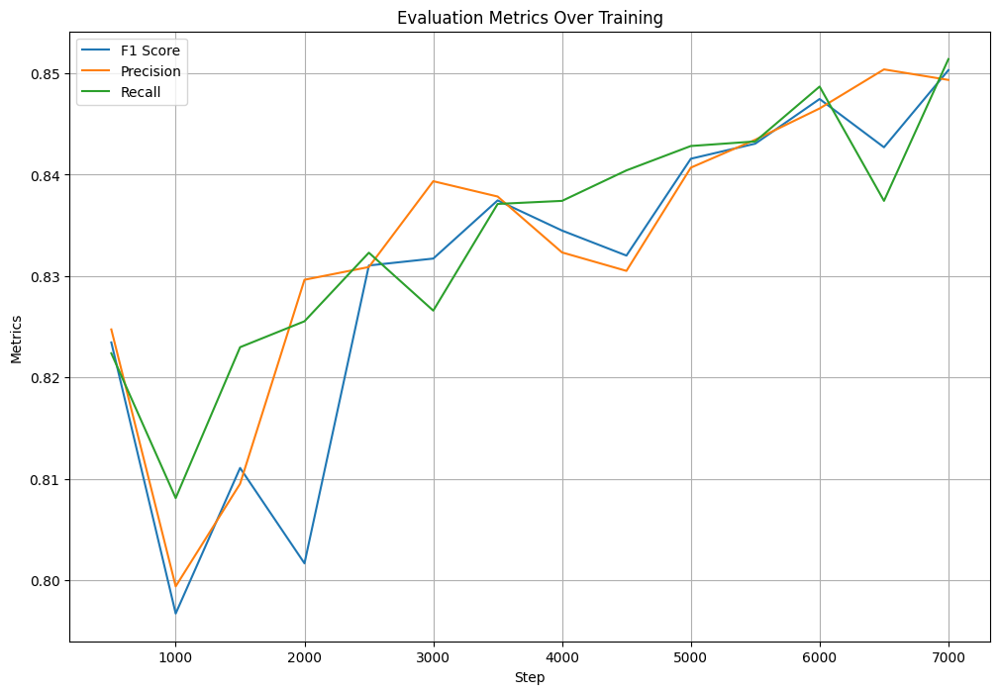

In [62]:
# Function to plot metrics
plt.figure(figsize=(12, 8))
#plt.plot(steps, accuracy, label='Accuracy')
plt.plot(steps, f1, label='F1 Score')
plt.plot(steps, precision, label='Precision')
plt.plot(steps, recall, label='Recall')
plt.xlabel('Step')
plt.ylabel('Metrics')
plt.title('Evaluation Metrics Over Training')
plt.legend()
plt.grid(True)
plt.savefig(os.path.join(output_dir, 'metrics_plot.png'))
plt.show()

#### sample test

In [63]:
nlp = pipeline ("sentiment-analysis", model = model, tokenizer = tokenizer)

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


[{'label': 'LABEL_2', 'score': 0.8793855309486389}]

In [77]:
nlp ("It was super fantastic!")

[{'label': 'LABEL_2', 'score': 0.9938188195228577}]

In [79]:
nlp ("Although it wasn't good, has it's customer!")

[{'label': 'LABEL_2', 'score': 0.6209414005279541}]

In [76]:
nlp ("I don't care, it was either good or bad")

[{'label': 'LABEL_1', 'score': 0.9595412611961365}]

In [69]:
nlp ("It was not my choice!")

[{'label': 'LABEL_0', 'score': 0.9851388335227966}]

#### confusion matrix

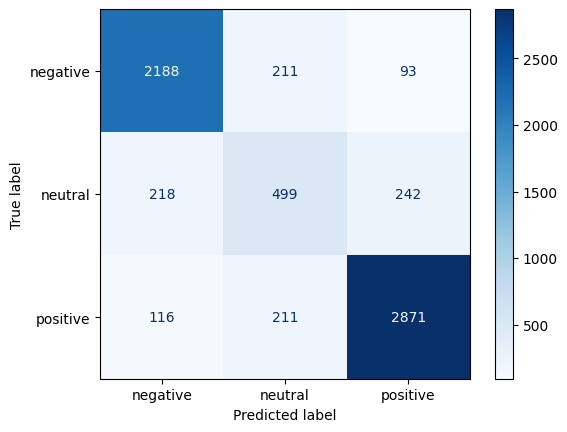

In [65]:
predictions = trainer.predict(test_dataset)
pred_labels = np.argmax(predictions.predictions, axis=1)

# Compute confusion matrix
cm = confusion_matrix(test_labels, pred_labels, labels=[0, 1, 2])

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['negative', 'neutral', 'positive'])
disp.plot(cmap=plt.cm.Blues)
plt.show()

#### other metrics

In [66]:
# Compute precision, recall, f1-score
report = classification_report(test_labels, pred_labels, target_names=['negative', 'neutral', 'positive'])
print(report)

              precision    recall  f1-score   support

    negative       0.87      0.88      0.87      2492
     neutral       0.54      0.52      0.53       959
    positive       0.90      0.90      0.90      3198

    accuracy                           0.84      6649
   macro avg       0.77      0.77      0.77      6649
weighted avg       0.83      0.84      0.83      6649



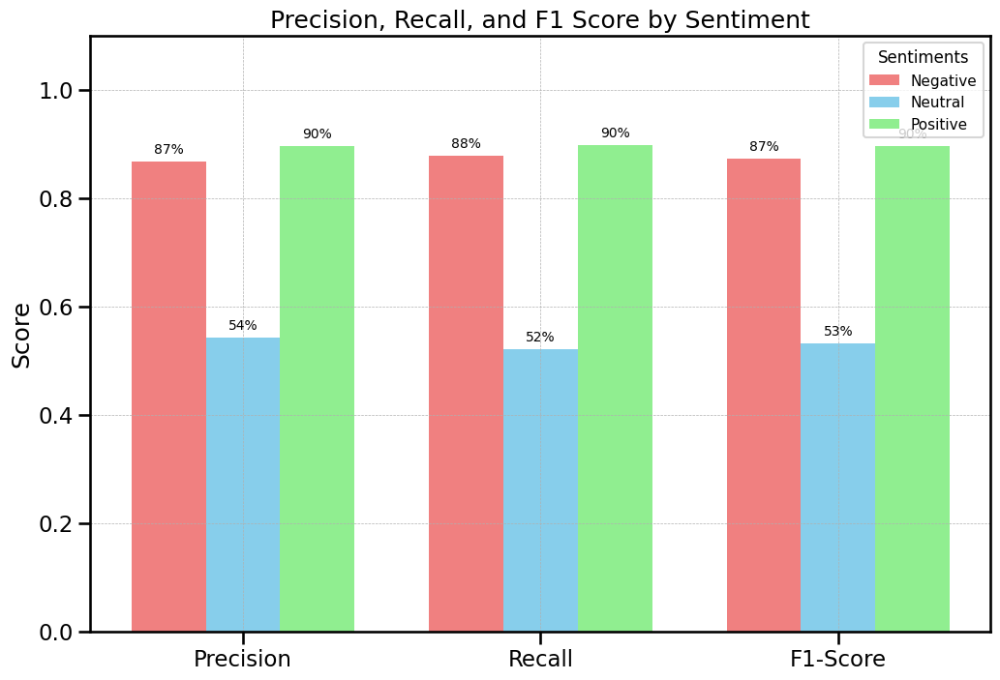

In [67]:
# Compute precision, recall, f1-score
precision, recall, f1, _ = precision_recall_fscore_support(test_labels, pred_labels, labels=[0, 1, 2])

# Data preparation
metrics = np.vstack([precision, recall, f1]).T
labels = ['Negative', 'Neutral', 'Positive']
metric_labels = ['Precision', 'Recall', 'F1-Score']

# Create a DataFrame
df = pd.DataFrame(metrics, index=labels, columns=metric_labels)
df = df.reset_index().melt(id_vars='index').rename(columns={'index': 'Sentiment'})

# Updated color themes based on your selection
color_themes = {
    'Negative': 'lightcoral',  # More standardized color name that matplotlib recognizes
    'Neutral': 'skyblue',
    'Positive': 'lightgreen'
}

# Plotting
plt.figure(figsize=(12, 8))
sns.set_context("talk")  # Makes text larger, suitable for presentations

# Adjusted plotting to show all bars
bar_width = 0.25  # width of bars
x = np.arange(len(metric_labels))  # label locations

# Plot bars and add text labels for each bar
for i, (sentiment, color) in enumerate(color_themes.items()):
    bars = plt.bar(x + i * bar_width, df[df['Sentiment'] == sentiment]['value'], width=bar_width, label=sentiment, color=color)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.0%}', ha='center', va='bottom', fontsize=10)

plt.title('Precision, Recall, and F1 Score by Sentiment')
plt.ylabel('Score')
plt.xticks(x + bar_width, metric_labels)  # Set x-ticks to be in the middle of the grouped bars
plt.ylim(0, 1.1)  # Extend y-axis to make space for text labels
plt.grid(True, linestyle='--', linewidth=0.5)

# Adjust legend
plt.legend(title='Sentiments', title_fontsize='12', fontsize='11', loc='upper right', bbox_to_anchor=(1.0, 1.0))

# Show the plot
plt.show()


#### save the model

In [68]:
model_path = "Fine-tuned-Roberta-for-McDonalds-reviews"
trainer.save_model(model_path)
tokenizer.save_pretrained(model_path)

('Fine-tuned-Roberta-for-McDonalds-reviews\\tokenizer_config.json',
 'Fine-tuned-Roberta-for-McDonalds-reviews\\special_tokens_map.json',
 'Fine-tuned-Roberta-for-McDonalds-reviews\\vocab.json',
 'Fine-tuned-Roberta-for-McDonalds-reviews\\merges.txt',
 'Fine-tuned-Roberta-for-McDonalds-reviews\\added_tokens.json')